In [1]:
# I-PATH
# PROJET4_DATA_SCIENTITS_OCR
# Changement du repertoire: A ne plus changer.
import os
os.chdir('C://Users//yebel//Desktop//OPENCLASSROOMS//FORMATION_DATA_SCIENTIST//PROJETS_DS_OCR//P4')

In [2]:
# I-1 Installation de la librairie nouvelle.
#!pip install folium

In [3]:
# I-2 Importation des librairies usitées.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
import folium.plugins
import scipy.stats as stats
from sklearn.model_selection import train_test_split
from sklearn import neighbors
from sklearn.metrics import mean_squared_error 
from math import sqrt
from math import radians, cos, sin, asin, sqrt
from sklearn.preprocessing import FunctionTransformer
import warnings
warnings.filterwarnings("ignore")
%pylab inline
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 2000)

Populating the interactive namespace from numpy and matplotlib


In [4]:
# II- IMPORTATION & DESCRIPTION DES DONNEES.
# II-1 Importation du dataset.
data = pd.read_csv("2016_building_energy_benchmarking.csv")
# Visualisation du dataset.
data

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7.226362e+06,7.456910e+06,2003882.00,1.156514e+06,3.946027e+06,12764.529300,1.276453e+06,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8.387933e+06,8.664479e+06,0.00,9.504252e+05,3.242851e+06,51450.816410,5.145082e+06,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,7.258702e+07,7.393711e+07,21566554.00,1.451544e+07,4.952666e+07,14938.000000,1.493800e+06,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6.794584e+06,6.946800e+06,2214446.25,8.115253e+05,2.768924e+06,18112.130860,1.811213e+06,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,1.417261e+07,1.465650e+07,0.00,1.573449e+06,5.368607e+06,88039.984380,8.803998e+06,False,NaN,Compliant,NaN,505.01,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,50222,2016,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,NaN,1624049080,2,GREATER DUWAMISH,47.56722,-122.31154,1990,1.0,1,12294,0,12294,Office,Office,12294.0,NaN,NaN,NaN,NaN,NaN,46.0,69.099998,76.699997,161.699997,176.100006,8.497457e+05,9.430032e+05,0.00,1.536550e+05,5.242709e+05,3254.750244,3.254750e+05,True,NaN,Error - Correct Default Data,NaN,20.94,1.70
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,2,DOWNTOWN,47.59625,-122.32283,2004,1.0,1,16000,0,16000,Other - Recreation,Other - Recreation,16000.0,NaN,NaN,NaN,NaN,NaN,NaN,59.400002,65.900002,114.199997,118.900002,9.502762e+05,1.053706e+06,0.00,1.162210e+05,3.965461e+05,5537.299805,5.537300e+05,False,NaN,Compliant,NaN,32.17,2.01
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,7,MAGNOLIA / QUEEN ANNE,47.63644,-122.35784,1974,1.0,1,13157,0,13157,"Fitness Center/Health Club/Gym, Other - Recrea...",Other - Recreation,7583.0,Fitness Center/Health Club/Gym,5574.0,Swimmin

In [5]:
# II-2 DESCRIPTION DES DONNEES.
# II-2-1 Fonction qui détermine le taux de remplissage.
def shape(dataframe):
    "Calcule et affiche la forme de dataframe et le taux de remplissage"
    
    # Obtenir le nombre de lignes et de colonnes dans le dataframe
    nb_rows, nb_columns = dataframe.shape
    print("\nLe dataFrame a {} lignes et {} colonnes.".format(nb_rows,nb_columns))
    
    # Obtenir le nombre de données non-Nan dans le dataframe 
    nb_data = dataframe.describe(include='all').loc["count"].sum()

    # calcul du taux de remplissage en arrondissant à 2 décimales 
    import math
    filling_rate = math.floor(nb_data*10000 / (nb_rows * nb_columns))/10000
    print("Le taux de remplissage global du DataFrame est de : {:.2%}".format(filling_rate))
    
    # calcul des valeurs manquantes 
    nb_missing = int((nb_rows * nb_columns) - nb_data)
    print("Il y a {} valeurs manquantes sur {}.".format(nb_missing, int(nb_rows * nb_columns)))

In [6]:
# II-2-2 Application de la fonction.
shape(data)


Le dataFrame a 3376 lignes et 46 colonnes.
Le taux de remplissage global du DataFrame est de : 87.15%
Il y a 19952 valeurs manquantes sur 155296.


In [7]:
# II-2-3 Edition des informations contenues dans le dataset.
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

In [8]:
# II-2-4 Identification des types de variables du dataset.
data.dtypes.value_counts()

float64    22
object     15
int64       8
bool        1
dtype: int64

In [9]:
# II-2-5 Décompte du nombre d'éléments distincts dans le dataset.
data.nunique()

OSEBuildingID                      3376
DataYear                              1
BuildingType                          8
PrimaryPropertyType                  24
PropertyName                       3362
Address                            3354
City                                  1
State                                 1
ZipCode                              55
TaxParcelIdentificationNumber      3268
CouncilDistrictCode                   7
Neighborhood                         19
Latitude                           2876
Longitude                          2656
YearBuilt                           113
NumberofBuildings                    17
NumberofFloors                       50
PropertyGFATotal                   3195
PropertyGFAParking                  496
PropertyGFABuilding(s)             3193
ListOfAllPropertyUseTypes           466
LargestPropertyUseType               56
LargestPropertyUseTypeGFA          3122
SecondLargestPropertyUseType         50
SecondLargestPropertyUseTypeGFA    1352


In [10]:
# II-2-6 Valeurs manquantes par colonnes.
def missings_value(data): 
    mis_val = data.isnull().sum()
    #pourcentage de valeurs manquantes
    mis_val_percent = 100 * data.isnull().sum() / len(data) 
    # concaténation du nombre de valeur manquante et des pourcentages respectif
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)

    mis_val_table_ren_columns = mis_val_table.rename(columns = {0 : 'Valeurs manquantes', 1 : '% de valeurs manquantes'})

    mis_val_table_ren_columns = mis_val_table_ren_columns[mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
            '% de valeurs manquantes', ascending=False).round(1)

    print ("Le jeu de donnée seléctionné a  " + str(data.shape[1]) + " columns.\n"      
                "Il y a " + str(mis_val_table_ren_columns.shape[0]) +
                  " colonnes avec des valeurs manquantes.")

    return mis_val_table_ren_columns

In [11]:
# II-2-7 Application de la fonction.
missings_value(data)

Le jeu de donnée seléctionné a  46 columns.
Il y a 26 colonnes avec des valeurs manquantes.


,Valeurs manquantes,% de valeurs manquantes
Comments,3376,100.0
Outlier,3344,99.1
YearsENERGYSTARCertified,3257,96.5
ThirdLargestPropertyUseTypeGFA,2780,82.3
ThirdLargestPropertyUseType,2780,82.3
SecondLargestPropertyUseType,1697,50.3
SecondLargestPropertyUseTypeGFA,1697,50.3
ENERGYSTARScore,843,25.0
LargestPropertyUseType,20,0.6
LargestPropertyUseTypeGFA,20,0.6


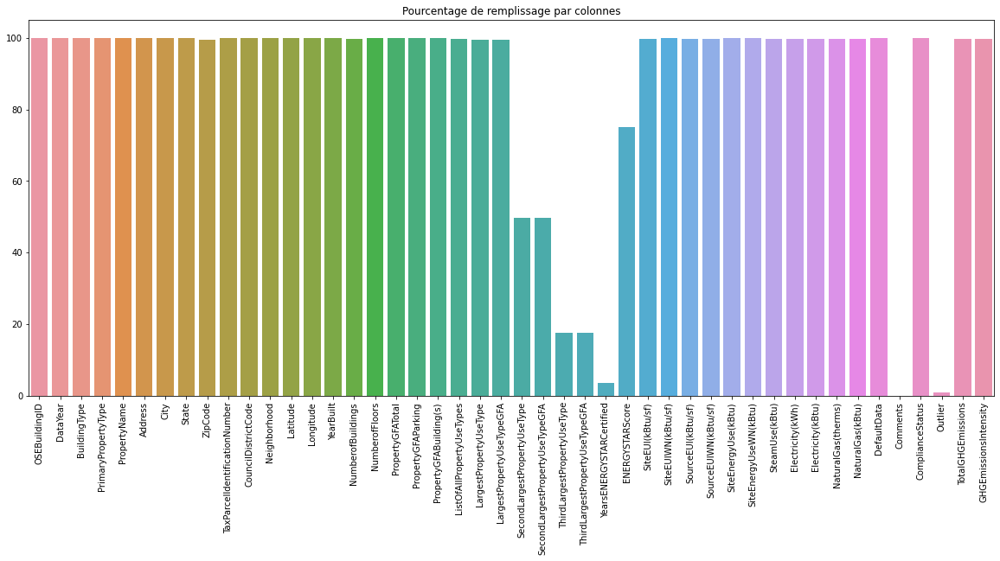

In [12]:
# II-2-8 Taux de remplissage des features engineering.
nb_row=data.shape[0]
percentage=data.apply(lambda x:(x.notna().sum()/nb_row)*100)
# Identification des colonnes du dataset.
columns=data.columns
# Représentation graphique.
plt.figure(figsize=(20,8))
plt.xticks(rotation=90)
sns.barplot(x=columns,y=percentage)
plt.title('Pourcentage de remplissage par colonnes')
plt.savefig('GRAPHS/1- Taux_VM')
plt.show()

In [13]:
# II-2-9 Analyse des doublons dans le dataset.
duplicate_building = data.drop_duplicates(subset=['OSEBuildingID'], keep='last')
# Visualisation.
duplicate_building

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7.226362e+06,7.456910e+06,2003882.00,1.156514e+06,3.946027e+06,12764.529300,1.276453e+06,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8.387933e+06,8.664479e+06,0.00,9.504252e+05,3.242851e+06,51450.816410,5.145082e+06,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,7.258702e+07,7.393711e+07,21566554.00,1.451544e+07,4.952666e+07,14938.000000,1.493800e+06,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6.794584e+06,6.946800e+06,2214446.25,8.115253e+05,2.768924e+06,18112.130860,1.811213e+06,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,1.417261e+07,1.465650e+07,0.00,1.573449e+06,5.368607e+06,88039.984380,8.803998e+06,False,NaN,Compliant,NaN,505.01,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,50222,2016,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,NaN,1624049080,2,GREATER DUWAMISH,47.56722,-122.31154,1990,1.0,1,12294,0,12294,Office,Office,12294.0,NaN,NaN,NaN,NaN,NaN,46.0,69.099998,76.699997,161.699997,176.100006,8.497457e+05,9.430032e+05,0.00,1.536550e+05,5.242709e+05,3254.750244,3.254750e+05,True,NaN,Error - Correct Default Data,NaN,20.94,1.70
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,2,DOWNTOWN,47.59625,-122.32283,2004,1.0,1,16000,0,16000,Other - Recreation,Other - Recreation,16000.0,NaN,NaN,NaN,NaN,NaN,NaN,59.400002,65.900002,114.199997,118.900002,9.502762e+05,1.053706e+06,0.00,1.162210e+05,3.965461e+05,5537.299805,5.537300e+05,False,NaN,Compliant,NaN,32.17,2.01
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,7,MAGNOLIA / QUEEN ANNE,47.63644,-122.35784,1974,1.0,1,13157,0,13157,"Fitness Center/Health Club/Gym, Other - Recrea...",Other - Recreation,7583.0,Fitness Center/Health Club/Gym,5574.0,Swimmin

In [14]:
# II-2-10 Scatter plot de la répartition de la consomation  en énergie des bâtiments dans la ville de Seattle.
fig = px.scatter_mapbox(data, lat="Latitude", lon="Longitude", hover_name="PropertyName", color = "SiteEnergyUseWN(kBtu)"
                       ,color_continuous_scale="viridis", zoom = 10, title= "Répartition de la consommation  normalisée en énergie des bâtiments dans la ville de Seattle" )
fig.update_layout(mapbox_style="open-street-map")
#fig.update_layout(title = "Répartition de la consomation  en énergie des bâtiments dans la ville de Seattle" )
fig.update_layout(margin={"r":0,"l":0,"b":0})
plt.savefig('GRAPHS/2- ConsoEnergy_Seattlle')
fig.show()

<Figure size 432x288 with 0 Axes>

In [15]:
# II-2-11 Coordonnées du centre de Seattle
seattle_lat = 47.6062
seattle_lon = -122.3321

seattle = folium.Map(location=[seattle_lat, seattle_lon], zoom_start=11)

#Clusters
marker_cluster = folium.plugins.MarkerCluster().add_to(seattle)
for lat, lon, in zip(data.Latitude, data.Longitude):
    folium.Marker(location=[lat, lon]).add_to(marker_cluster)

seattle

In [16]:
# II-2-12 Staistiques descriptives du dataset.
data.describe().T

,count,mean,std,min,25%,50%,75%,max
OSEBuildingID,3376.0,2.120899e+04,1.222376e+04,1.00000,19990.750000,2.311200e+04,2.599425e+04,5.022600e+04
DataYear,3376.0,2.016000e+03,0.000000e+00,2016.00000,2016.000000,2.016000e+03,2.016000e+03,2.016000e+03
ZipCode,3360.0,9.811695e+04,1.861520e+01,98006.00000,98105.000000,9.811500e+04,9.812200e+04,9.827200e+04
CouncilDistrictCode,3376.0,4.439277e+00,2.120625e+00,1.00000,3.000000,4.000000e+00,7.000000e+00,7.000000e+00
Latitude,3376.0,4.762403e+01,4.775842e-02,47.49917,47.599860,4.761867e+01,4.765712e+01,4.773387e+01
Longitude,3376.0,-1.223348e+02,2.720329e-02,-122.41425,-122.350662,-1.223325e+02,-1.223194e+02,-1.222210e+02
YearBuilt,3376.0,1.968573e+03,3.308816e+01,1900.00000,1948.000000,1.975000e+03,1.997000e+03,2.015000e+03
NumberofBuildings,3368.0,1.106888e+00,2.108402e+00,0.00000,1.000000,1.000000e+00,1.000000e+00,1.110000e+02
NumberofFloors,3376.0,4.709123e+00,5.494465e+00,0.00000,2.000000,4.000000e+00,5.000000e+00,9.900000e+01
PropertyGFATotal,3376.0,9.483354e+04,2.188376e+05,11285.00000,28487.000000,4.417500e+04,9.099200e+04,9.320156e+06


In [17]:
# Rq: Dans le cadre du projet, il est précisé que seuls les bâtiments non résidentiels seront étudiés. Donc Nous allons supprimer toutes les lignes correspondant à des habitations.
# II-2-13 Aperçu des différents types d'habitation.
data['BuildingType'].unique()

array(['NonResidential', 'Nonresidential COS', 'Multifamily MR (5-9)',
       'SPS-District K-12', 'Campus', 'Multifamily LR (1-4)',
       'Multifamily HR (10+)', 'Nonresidential WA'], dtype=object)

In [18]:
# NonResidential: Hotel, Other, Mixed Use Property, College/University, Small- and Mid-Sized Office, Self-Storage Facility, K-12 School, Large Office, Retail Store, Senior Care Community, Medical Office, Hospital, Residence Hall/Dormitory, Non-Refrigerated Warehouse, Worship Facility, Supermarket/Grocery Store, Distribution Center, Refrigerated Warehouse, Restaurant, Low-Rise Multifamily, University, Warehouse, Residence Hall, Laboratory,
# Nonresidential COS: Other, Non-Refrigerated Warehouse, Small- and Mid-Sized Office, Distribution Center, Large Office, Mixed Use Property, Medical Office, Warehouse, Office,
# Multifamily MR (5-9): Mid-Rise Multifamily, Mixed Use Property, Senior Care Community, Other, Residence Hall,
# SPS-District K-12: K-12 School, Other
# Campus: College/University, Large Office, Other, Mixed Use Property, K-12 School, Low-Rise Multifamily, Restaurant, University,
# Multifamily LR (1-4): Low-Rise Multifamily, Mixed Use Property, Other, Senior Care Community, Small- and Mid-Sized Office, College/University, University,
# Multifamily HR (10+): High-Rise Multifamily, Other, Senior Care Community, Hotel,
# Nonresidential WA: University.

In [19]:
# II-2-14 BÂTIMENTS RESIDENTIELS.
# SPS-District K-12 = Seattle public school District.
family_buildings = data.BuildingType.str.contains("Multifamily")
print("Le nombre de bâtiments résidentiels est ", len(data[family_buildings]))
# Visualisation des bâtiments résidentiels.
data[family_buildings]

Le nombre de bâtiments résidentiels est  1708


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
9,13,2016,Multifamily MR (5-9),Mid-Rise Multifamily,Lyon Building,607 - 3rd Ave.,Seattle,WA,98104.0,0939000105,7,DOWNTOWN,47.602840,-122.331840,1910,1.0,6,63712,1496,62216,Multifamily Housing,Multifamily Housing,56132.0,NaN,NaN,NaN,NaN,NaN,1.0,81.500000,85.599998,182.699997,187.399994,4.573777e+06,4.807680e+06,1.039735e+06,7.420912e+05,2532015.0,10020.259770,1002026.0,False,NaN,Compliant,NaN,151.12,2.37
165,265,2016,Multifamily MR (5-9),Mid-Rise Multifamily,YWCA Opportunity Place,2024 3rd Avenue,Seattle,WA,98121.0,8729690000,7,DOWNTOWN,47.613160,-122.341530,2003,1.0,7,116947,0,116947,"Multifamily Housing, Office, Other - Lodging/R...",Multifamily Housing,81740.0,Office,27403.0,Other - Lodging/Residential,12851.0,NaN,NaN,79.900002,83.099998,175.399994,178.800003,1.004012e+07,1.044268e+07,0.000000e+00,1.612728e+06,5502627.0,45374.941410,4537494.0,False,NaN,Compliant,NaN,279.35,2.39
173,280,2016,Multifamily MR (5-9),Mid-Rise Multifamily,Wintonia,1431 Minor Ave,Seattle,WA,98101.0,8725600350,7,EAST,47.613600,-122.327850,1909,1.0,6,51976,0,51976,Multifamily Housing,Multifamily Housing,50350.0,NaN,NaN,NaN,NaN,NaN,34.0,83.199997,89.000000,156.800003,162.899994,4.189569e+06,4.480534e+06,0.000000e+00,4.903724e+05,1673151.0,25164.187500,2516419.0,False,NaN,Compliant,NaN,145.31,2.80
188,296,2016,Multifamily LR (1-4),Low-Rise Multifamily,Cooper School Artist's Lofts,4408 Delridge Way SW,Seattle,WA,98106.0,3388120000,1,DELRIDGE,47.563790,-122.363010,1917,1.0,4,56617,0,56617,Multifamily Housing,Multifamily Housing,56617.0,NaN,NaN,NaN,NaN,NaN,15.0,35.099998,38.599998,80.800003,88.400002,1.986611e+06,2.185550e+06,0.000000e+00,3.493257e+05,1191899.0,7947.119629,794712.0,False,NaN,Compliant,NaN,50.52,0.89
189,297,2016,Multifamily MR (5-9),Mid-Rise Multifamily,LAKE CITY COURT,12730 33RD AVE NE,Seattle,WA,98125.0,3993000000,5,NORTH,47.722320,-122.291810,2009,1.0,6,56745,0,56745,Multifamily Housing,Multifamily Housing,43673.0,NaN,NaN,NaN,NaN,NaN,54.0,56.599998,59.000000,133.899994,138.500000,2.473962e+06,2.574628e+06,0.000000e+00,4.558248e+05,1555274.0,9186.879883,918688.0,False,NaN,Compliant,NaN,59.63,1.05
190,299,2016,Multifamily LR (1-4),Low-Rise Multifamily,Othello Building,3815 S Othello St,Seattle,WA,98118.0,6434000000,2,GREATER DUWAMISH,47.536850,-122.284060,2003,1.0,4,67920,0,67920,"Medical Office, Multifamily Housing, Office, R...",Multifamily Housing,24600.0,Medical Office,12917.0,Office,4150.0,NaN,NaN,63.099998,65.199997,193.399994,199.199997,2.772125e+06,2.864132e+06,0.000000e+00,7.840611e+05,2675217.0,969.079956,96908.0,False,NaN,Compliant,NaN,23.80,0.35
486,655,2016,Multifamily MR (5-9),Mid-Rise Multifamily,Tashiro_kaplan,101 Prefontaine PL S,Seattle,WA,98104.0,8566600000,7,DOWNTOWN,47.601380,-122.329970,2002,1.0,6,117950,11210,106740,"Multifamily Housing, Other - Lodging/Residenti...",Multifamily Housing,117950.0,NaN,NaN,NaN,NaN,NaN,55.0,27.000000,29.100000,83.699997,89.900002,3.187951e+06,3.434358e+06,0.000000e+00,9.148228e+05,3121375.0,665.750000,66575.0,False,NaN,Compliant,NaN,25.30,0.21
503,684,2016,Multifamily HR (10+),High-Rise Multifamily,Legacy Centre & Arbor Place Tower,2505 2nd Ave,Seattle,WA,98121.0,0254600000,7,DOWNTOWN,47.615340,

In [20]:
# II-2-15 Détermination des bâtiments non résidentiels.
data = data[~family_buildings]
print("Le nombre de bâtiments non-résidentiels est ", len(data))
# Visualisation des bâtiments non résidentiels.
data

Le nombre de bâtiments non-résidentiels est  1668


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.612200,-122.337990,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7.226362e+06,7.456910e+06,2.003882e+06,1.156514e+06,3.946027e+06,1.276453e+04,1.276453e+06,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.613170,-122.333930,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.000000,Restaurant,4622.000000,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8.387933e+06,8.664479e+06,0.000000e+00,9.504252e+05,3.242851e+06,5.145082e+04,5.145082e+06,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.613930,-122.338100,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,7.258702e+07,7.393711e+07,2.156655e+07,1.451544e+07,4.952666e+07,1.493800e+04,1.493800e+06,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.614120,-122.336640,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6.794584e+06,6.946800e+06,2.214446e+06,8.115253e+05,2.768924e+06,1.811213e+04,1.811213e+06,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.613750,-122.340470,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.000000,Swimming Pool,0.000000,NaN,75.0,114.800003,118.699997,211.399994,215.600006,1.417261e+07,1.465650e+07,0.000000e+00,1.573449e+06,5.368607e+06,8.803998e+04,8.803998e+06,False,NaN,Compliant,NaN,505.01,2.88
5,9,2016,Nonresidential COS,Other,West Precinct,810 Virginia St,Seattle,WA,98101.0,0660000560,7,DOWNTOWN,47.616230,-122.336570,1999,1.0,2,97288,37198,60090,Police Station,Police Station,88830.0,NaN,NaN,NaN,NaN,NaN,NaN,136.100006,141.600006,316.299988,320.500000,1.208662e+07,1.258171e+07,0.000000e+00,2.160444e+06,7.371434e+06,4.715182e+04,4.715182e+06,False,NaN,Compliant,NaN,301.81,3.10
6,10,2016,NonResidential,Hotel,Camlin,1619 9th Avenue,Seattle,WA,98101.0,0660000825,7,DOWNTOWN,47.613900,-122.332830,1926,1.0,11,83008,0,83008,Hotel,Hotel,81352.0,NaN,NaN,NaN,NaN,NaN,27.0,70.800003,74.500000,146.600006,154.699997,5.758795e+06,6.062768e+06,0.000000e+00,8.239199e+05,2.811215e+06,2.947580e+04,2.947580e+06,False,NaN,Compliant,NaN,176.14,2.12
7,11,2016,NonResidential,Other,Paramount Theatre,911 Pine St,Seattle,WA,98101.0,0660000955,7,DOWNTOWN,47.613270,-122.331360,1926,1.0,8,102761,0,102761,Other - Entertainment/Public Assembly,Other - Entertainment/Public Assembly,102761.0,NaN,NaN,NaN,NaN,NaN,NaN,61.299999,68.800003,141.699997,152.300003,6.298132e+06,7.067882e+06,2.276286e+06,1.065843e+06,3.636655e+06,3.851890e+03,3.851890e+05,False,NaN,Compliant,NaN,221.51,2.16
8,12,2016,NonResidential,Hotel,311wh-Pioneer Squa

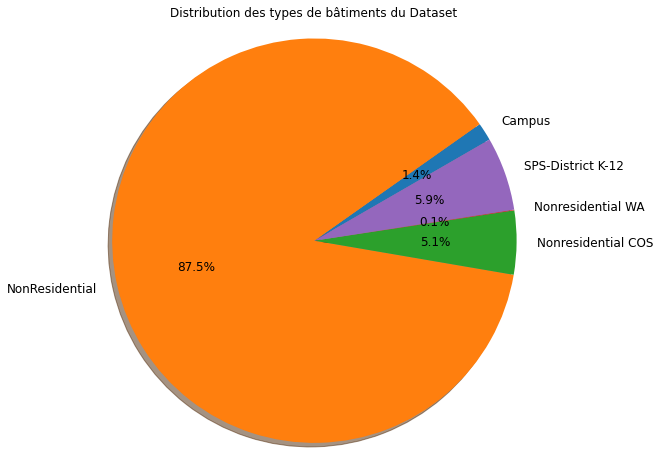

In [21]:
# III-ANALYSE-NETTOYAGE & CORRELATION LINEAIRES DES DONNEES.
# III-1-ANALYSE EXPLORATOIRE & FEATURES ENGINEERING.
# III-1-1 Distribution des types de bâtiments nor-résidentiels du Dataset.
building_type = data.groupby(by='BuildingType')['OSEBuildingID'].nunique()
fig, ax = plt.subplots(figsize=(8,8))
ax.pie(building_type.values, labels=building_type.index, 
       autopct='%1.1f%%', shadow=True, startangle=30,
       textprops=dict(color="black",size=12))
ax.axis('equal')
ax.set_title("Distribution des types de bâtiments du Dataset")
plt.savefig('GRAPHS/3- Bât_NonResid')
plt.show()

In [22]:
# III-1-2 Identification des Types de construction des bâtiments.
data.loc[(data['BuildingType']=="NonResidential"),'PrimaryPropertyType'].value_counts()

Small- and Mid-Sized Office    288
Other                          185
Warehouse                      180
Large Office                   168
Mixed Use Property             102
Retail Store                    91
Hotel                           76
Worship Facility                71
Distribution Center             51
Supermarket / Grocery Store     40
K-12 School                     39
Medical Office                  38
Self-Storage Facility           28
Residence Hall                  21
Senior Care Community           20
University                      17
Refrigerated Warehouse          12
Restaurant                      11
Hospital                        10
Laboratory                      10
Low-Rise Multifamily             2
Name: PrimaryPropertyType, dtype: int64

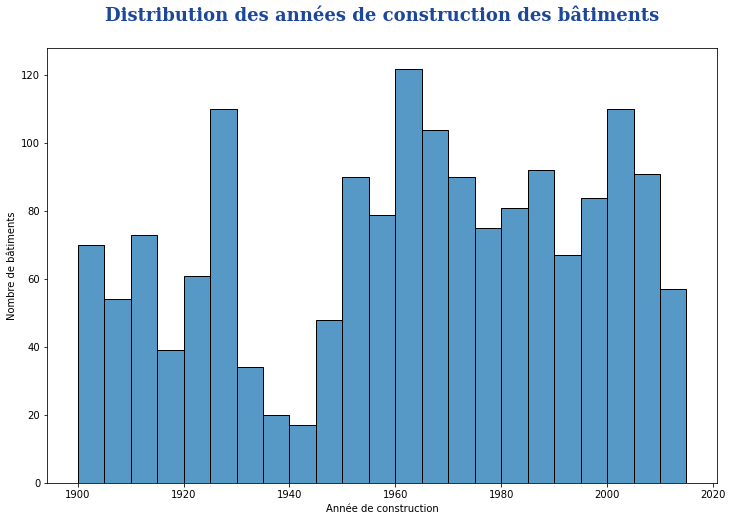

In [23]:
# III-1-3 Distribution des années de construction des bâtiments.
# Dans cette séction nous allons regarder les distributions des années de construction des bâtiments.
font_title = {'family': 'serif', 'color':  '#1d479b', 'weight': 'bold','size': 18}
fig = plt.figure(figsize = (12,8))
ax = sns.histplot(data=data, x = 'YearBuilt', bins = int((data.YearBuilt.max() - data.YearBuilt.min())/5))
ax.set_xlabel("Année de construction")
ax.set_ylabel("Nombre de bâtiments")
plt.title(f"Distribution des années de construction des bâtiments\n", fontdict = font_title)
plt.savefig('GRAPHS/4- Âge_Constr_Bât')
plt.show()

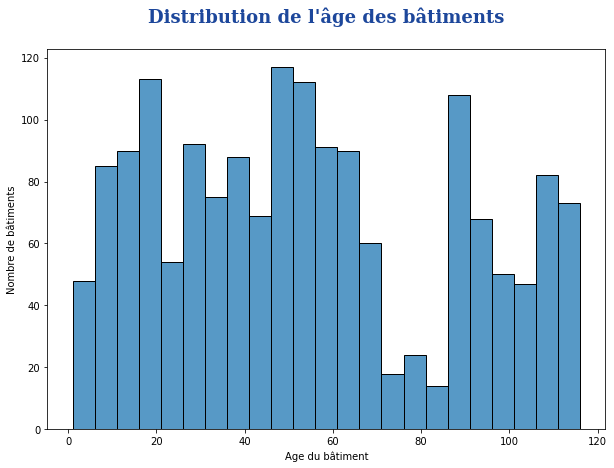

In [24]:
# Rq: En plus de l'année de construction, il serait intéressant de traiter l'âge des bâtiments pour réduire la dispersion des données et lier l'année des relevés.
# Nous allons donc créer cette nouvelle variable et supprimer l'année de construction.
# III-1-4 ÂGES DES BÂTIMENTS.
data['Âgebâtiment'] = data['DataYear'] - data['YearBuilt']
fig = plt.figure(figsize=(10,7))
ax = sns.histplot(data=data, x='Âgebâtiment', bins=int((data.Âgebâtiment.max() - data.Âgebâtiment.min())/5))
ax.set_xlabel("Age du bâtiment")
ax.set_ylabel("Nombre de bâtiments")
plt.title(f"Distribution de l'âge des bâtiments\n", fontdict=font_title)
plt.savefig('GRAPHS/5- ÂgeBâtiments')
plt.show()

In [25]:
# Âge moyen des bâtiments.
data['Âgebâtiment'].mean()

54.0863309352518

In [26]:
# III-1-5 Analyse de la variable Outlier.
data.groupby(['Outlier']).head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,Âgebâtiment
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7.226362e+06,7.456910e+06,2003882.00,1.156514e+06,3946027.0,12764.529300,1276453.0,False,NaN,Compliant,NaN,249.98,2.83,89
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8.387933e+06,8.664479e+06,0.00,9.504252e+05,3242851.0,51450.816410,5145082.0,False,NaN,Compliant,NaN,295.86,2.86,20
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,7.258702e+07,7.393711e+07,21566554.00,1.451544e+07,49526664.0,14938.000000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19,47
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6.794584e+06,6.946800e+06,2214446.25,8.115253e+05,2768924.0,18112.130860,1811213.0,False,NaN,Compliant,NaN,286.43,4.67,90
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,1.417261e+07,1.465650e+07,0.00,1.573449e+06,5368607.0,88039.984380,8803998.0,False,NaN,Compliant,NaN,505.01,2.88,36
226,350,2016,NonResidential,Large Office,Second And Spring Building,1100 Second Avenue,Seattle,WA,98101.0,0942000045,7,DOWNTOWN,47.60642,-122.33581,1958,1.0,6,172842,25920,146922,"Data Center, Office, Parking",Office,99890.0,Data Center,39336.0,Parking,25000.0,NaN,NaN,297.399994,299.200012,909.599976,911.500000,4.139950e+07,4.165040e+07,0.00,1.166315e+07,39794668.0,16048.309570,1604831.0,False,NaN,Non-Compliant,High outlier,362.66,2.10,58
384,539,2016,NonResidential,Retail Store,University Center,4501 Roosevelt Way NE,Seattle,WA,98105.0,5335200380,4,NORTHEAST,47.66178,-122.31812,1987,1.0,2,69492,0,69492,Retail Store,Retail Store,69800.0,Other,0.0,NaN,NaN,NaN,100.0,4.600000,4.600000,14.300000,14.300000,3.189628e+05,3.189628e+05,0.00,9.348260e+04,318963.0,0.000000,0.0,False,NaN,Non-Compliant,Low outlier,2.22,0.03,29
448,608,2016,NonResidential,Large Office,411 1ST AVE S (ID608),411 1ST AVE S,Seattle,WA,98104.0,5247800200,2,DOWNTOWN,47.59878,-122.33458,1913,5.0,7,154159,0,154159,Office,Office,193154.0,NaN,NaN,NaN,NaN,NaN,100.0,58.000000,58.799999,28.000000,28.700001,1.119592e+07,1.134876e+07,0.00,4.715030e+05,1608768.0,3430.500488,343050.0,False,NaN,Non-Compliant,Low outlier,29.43,0.19,103
517,704,2016,NonResidential,Large Office,401 Elliott Ave West,401 Ellio

In [27]:
# III-1-4-1 Remplacer les valeurs manquantes par 'Not outlier'.
data["Outlier"] = data["Outlier"].fillna('Not outlier')

In [28]:
# III-1-4-2 Edition de la moyenne des groupes de variables ci-dessus.
print(data.groupby(["ComplianceStatus"])["BuildingType","SiteEnergyUseWN(kBtu)","SteamUse(kBtu)","Electricity(kBtu)","TotalGHGEmissions", "Âgebâtiment"].mean())

                              SiteEnergyUseWN(kBtu)  SteamUse(kBtu)  \
ComplianceStatus                                                      
Compliant                              8.441981e+06   551183.055286   
Error - Correct Default Data           3.249695e+06     8119.587358   
Missing Data                           0.000000e+00        0.000000   
Non-Compliant                          5.134922e+06        0.000000   

                              Electricity(kBtu)  TotalGHGEmissions  \
ComplianceStatus                                                     
Compliant                          6.140840e+06         193.608908   
Error - Correct Default Data       1.675469e+06          80.138750   
Missing Data                       8.312924e+05          56.916429   
Non-Compliant                      4.384917e+06          38.118125   

                              Âgebâtiment  
ComplianceStatus                           
Compliant                       54.355943  
Error - Correct Defa

In [29]:
# III-1-4-3 Définition du nouveau dataset sans valeurs manquantes de la variable Outlier.
df = data[data['Outlier'].notna()]

In [30]:
# III-1-5 Définition de la variable 'out_clas avec ses groupes LOW and HIGH '.
df['out_clas'] = 'Low'
index_out = df['Outlier'].str.contains('High')
df.loc[index_out,'out_clas'] = 'High'

In [31]:
# III-1-5-1 Visualisation de la variable 'out_clas'.
df['out_clas']

0        Low
1        Low
2        Low
3        Low
4        Low
5        Low
6        Low
7        Low
8        Low
10       Low
11       Low
12       Low
13       Low
14       Low
15       Low
16       Low
17       Low
18       Low
19       Low
20       Low
21       Low
22       Low
23       Low
24       Low
25       Low
26       Low
27       Low
28       Low
29       Low
30       Low
31       Low
32       Low
33       Low
34       Low
35       Low
36       Low
37       Low
38       Low
39       Low
40       Low
41       Low
42       Low
43       Low
44       Low
45       Low
46       Low
47       Low
48       Low
49       Low
50       Low
51       Low
52       Low
53       Low
54       Low
55       Low
56       Low
57       Low
58       Low
59       Low
60       Low
61       Low
62       Low
63       Low
64       Low
65       Low
66       Low
67       Low
68       Low
69       Low
70       Low
71       Low
72       Low
73       Low
74       Low
75       Low
76       Low
77       Low

In [32]:
# III-1-5-2 Edition du minimum des groupe de variables ci-dessous.
print(df.groupby(["out_clas"])["BuildingType","SiteEnergyUseWN(kBtu)","SteamUse(kBtu)","Electricity(kBtu)","TotalGHGEmissions", "Âgebâtiment"].min())

            BuildingType  SiteEnergyUseWN(kBtu)  SteamUse(kBtu)  \
out_clas                                                          
High      NonResidential             27137190.0             0.0   
Low               Campus                    0.0             0.0   

          Electricity(kBtu)  TotalGHGEmissions  Âgebâtiment  
out_clas                                                     
High             27137187.0             189.18           16  
Low               -115417.0              -0.80            1  


In [33]:
# III-1-5-3 Edition de la moyenne du groupe de variables ci-dessous.
print(df.groupby(["out_clas"])["BuildingType","SiteEnergyUseWN(kBtu)","SteamUse(kBtu)","Electricity(kBtu)","TotalGHGEmissions", "Âgebâtiment"].mean())

          SiteEnergyUseWN(kBtu)  SteamUse(kBtu)  Electricity(kBtu)  \
out_clas                                                             
High               3.439380e+07        0.000000       3.346593e+07   
Low                8.033126e+06   513188.637782       5.810293e+06   

          TotalGHGEmissions  Âgebâtiment  
out_clas                                  
High              275.92000    37.000000  
Low               184.86399    54.106843  


In [34]:
# III-1-5-4 Visualisation de la moyenne des premières lignes du groupe  'out_clas'.
df.groupby(['out_clas']).head(17)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,Âgebâtiment,out_clas
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.00,1.156514e+06,3946027.0,12764.529300,1276453.0,False,NaN,Compliant,Not outlier,249.98,2.83,89,Low
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.00,9.504252e+05,3242851.0,51450.816410,5145082.0,False,NaN,Compliant,Not outlier,295.86,2.86,20,Low
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.00,1.451544e+07,49526664.0,14938.000000,1493800.0,False,NaN,Compliant,Not outlier,2089.28,2.19,47,Low
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6794584.0,6946800.5,2214446.25,8.115253e+05,2768924.0,18112.130860,1811213.0,False,NaN,Compliant,Not outlier,286.43,4.67,90,Low
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.00,1.573449e+06,5368607.0,88039.984380,8803998.0,False,NaN,Compliant,Not outlier,505.01,2.88,36,Low
5,9,2016,Nonresidential COS,Other,West Precinct,810 Virginia St,Seattle,WA,98101.0,0660000560,7,DOWNTOWN,47.61623,-122.33657,1999,1.0,2,97288,37198,60090,Police Station,Police Station,88830.0,NaN,NaN,NaN,NaN,NaN,NaN,136.100006,141.600006,316.299988,320.500000,12086616.0,12581712.0,0.00,2.160444e+06,7371434.0,47151.816410,4715182.0,False,NaN,Compliant,Not outlier,301.81,3.10,17,Low
6,10,2016,NonResidential,Hotel,Camlin,1619 9th Avenue,Seattle,WA,98101.0,0660000825,7,DOWNTOWN,47.61390,-122.33283,1926,1.0,11,83008,0,83008,Hotel,Hotel,81352.0,NaN,NaN,NaN,NaN,NaN,27.0,70.800003,74.500000,146.600006,154.699997,5758795.0,6062767.5,0.00,8.239199e+05,2811215.0,29475.800780,2947580.0,False,NaN,Compliant,Not outlier,176.14,2.12,90,Low
7,11,2016,NonResidential,Other,Paramount Theatre,911 Pine St,Seattle,WA,98101.0,0660000955,7,DOWNTOWN,47.61327,-122.33136,1926,1.0,8,102761,0,102761,Other - Entertainment/Public Assembly,Other - Entertainment/Public Assembly,102761.0,NaN,NaN,NaN,NaN,NaN,NaN,61.299999,68.800003,141.699997,152.300003,6298131.5,7067881.5,2276286.50,1.065843e+06,3636655.0,3851.890137,385189.0,False,NaN,Compliant,Not outlier,221.51,2.16,90,Low
8,12,2016,NonResidential,Hotel,311wh-Pioneer Square,612 2nd Ave,Seattle,WA

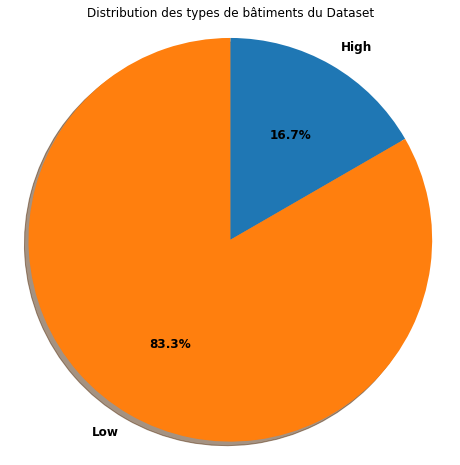

In [35]:
# III-1-5-5 Distribution des types de bâtiments des groupes LOW and HIGH de la variable 'out_clas' du Dataset.
building_type = df.groupby(by='out_clas')['BuildingType'].nunique()

fig, ax = plt.subplots(figsize=(8,8))
ax.pie(building_type.values, labels=building_type.index, 
       autopct='%1.1f%%', shadow=True, startangle=30,
       textprops=dict(color="black",size=12, weight="bold"))
ax.axis('equal')
ax.set_title("Distribution des types de bâtiments du Dataset")
plt.savefig('GRAPHS/0- LOW_HIGH')
plt.show()

In [36]:
# III-1-6 Identification des HIGH 'OUTLIER' de la variable 'TotalGHGEmissions'.
# III-1-6-1 Regardent a High outlier 
len(df['TotalGHGEmissions'] > 362.66 )

1668

In [37]:
# III-1-6-2 Identification des HIGH 'OUTLIER' de la variable 'TotalGHGEmissions'. 
len(df['TotalGHGEmissions'] > 189 )

1668

In [38]:
# III-1-6-3 Identification des HIGH 'OUTLIER' de la variable 'TotalGHGEmissions'.
len(df['TotalGHGEmissions'] < 29.43 )

1668

In [39]:
# III-1-6-4 Donc on peut supprımer ces valeurs comme outlier.
data = df[df['TotalGHGEmissions'] < 189]

data = df[df['TotalGHGEmissions'] > 29.43]

In [40]:
# III-1-7 Identification des composantes de la variable 'ComplianceStatus'
data['ComplianceStatus'].unique()

array(['Compliant', 'Error - Correct Default Data', 'Missing Data',
       'Non-Compliant'], dtype=object)

In [41]:
# III-1-7-1 Taille de la variable 'ComplianceStatus'.
len(data['ComplianceStatus'])

1100

In [42]:
# III-1-7-2 Suppression de la composante 'Non-Compliant'.
data = data[~data['ComplianceStatus'].str.contains("Non-Compliant")]
data['ComplianceStatus'].unique()

array(['Compliant', 'Error - Correct Default Data', 'Missing Data'],
      dtype=object)

In [43]:
# III-1-8 Analyse de la Source principale d'énergie.
data[["Electricity(kBtu)","NaturalGas(kBtu)","SteamUse(kBtu)"]]

,Electricity(kBtu),NaturalGas(kBtu),SteamUse(kBtu)
0,3.946027e+06,1.276453e+06,2.003882e+06
1,3.242851e+06,5.145082e+06,0.000000e+00
2,4.952666e+07,1.493800e+06,2.156655e+07
3,2.768924e+06,1.811213e+06,2.214446e+06
4,5.368607e+06,8.803998e+06,0.000000e+00
5,7.371434e+06,4.715182e+06,0.000000e+00
6,2.811215e+06,2.947580e+06,0.000000e+00
7,3.636655e+06,3.851890e+05,2.276286e+06
8,7.297919e+06,6.425900e+06,0.000000e+00
10,6.187627e+06,4.591850e+06,5.237166e+06


In [44]:
# III-1-8-1 Identification des valeurs positives de la variable 'Electricity(kBtu)'.
data = data[data['Electricity(kBtu)'] > 0]

In [45]:
# III-1-8-2 Statistiques descriptives de la source d'énergie.
data[["Electricity(kBtu)","NaturalGas(kBtu)","SteamUse(kBtu)"]].describe()

,Electricity(kBtu),NaturalGas(kBtu),SteamUse(kBtu)
count,1.093000e+03,1.093000e+03,1.093000e+03
mean,8.252827e+06,2.926946e+06,7.808343e+05
std,2.530010e+07,1.144772e+07,6.793202e+06
min,3.000000e+00,0.000000e+00,0.000000e+00
25%,1.051644e+06,5.040460e+05,0.000000e+00
50%,2.998320e+06,1.006018e+06,0.000000e+00
75%,7.486064e+06,2.542771e+06,0.000000e+00
max,6.570744e+08,2.979090e+08,1.349435e+08


In [46]:
# III-1-8-3 DEFINITION DES TAUX DE CONSOMMATION DES DIFFERENTES SOURCES D’ENERGIE.
# III-1-8-3-1 Fonction déterminant le taux de consommation de l'électricité en termes grade:faible et élevé.
def consumption_rateE(score):
    if score < 3.72:
        grade ='Low Usage'
    else :
        grade='High Usage'
    return grade

data['consumption_rate_Electricity']= data['Electricity(kBtu)'].apply(consumption_rateE)

In [47]:
# III-1-8-3-2 Application de la fonction.
data['consumption_rate_Electricity']

0       High Usage
1       High Usage
2       High Usage
3       High Usage
4       High Usage
5       High Usage
6       High Usage
7       High Usage
8       High Usage
10      High Usage
11      High Usage
12      High Usage
13      High Usage
14      High Usage
15      High Usage
16      High Usage
17      High Usage
18      High Usage
19      High Usage
20      High Usage
21      High Usage
22      High Usage
23      High Usage
24      High Usage
26      High Usage
27      High Usage
29      High Usage
30      High Usage
32      High Usage
33      High Usage
35      High Usage
36      High Usage
37      High Usage
38      High Usage
39      High Usage
40      High Usage
41      High Usage
42      High Usage
43      High Usage
44      High Usage
45      High Usage
46      High Usage
47      High Usage
48      High Usage
49      High Usage
50      High Usage
51      High Usage
52      High Usage
53      High Usage
54      High Usage
55      High Usage
56      High Usage
57      High

In [48]:
# III-1-8-3-3 Fonction déterminant le taux de consommation du gaz naturel en termes grade:faible et élevé.
def consumption_rateG(score):
    if score < 1.36:
        label ='Low Usage'
    else :
        label = 'High Usage'
    return label

data['consumption_rate_Gas']=data['NaturalGas(kBtu)'].apply(consumption_rateG)

In [49]:
# III-1-8-3-4 Application de la fonction.
data['consumption_rate_Gas']

0       High Usage
1       High Usage
2       High Usage
3       High Usage
4       High Usage
5       High Usage
6       High Usage
7       High Usage
8       High Usage
10      High Usage
11      High Usage
12      High Usage
13      High Usage
14      High Usage
15       Low Usage
16      High Usage
17      High Usage
18      High Usage
19      High Usage
20      High Usage
21      High Usage
22      High Usage
23      High Usage
24      High Usage
26      High Usage
27      High Usage
29      High Usage
30      High Usage
32      High Usage
33      High Usage
35      High Usage
36       Low Usage
37      High Usage
38      High Usage
39      High Usage
40      High Usage
41      High Usage
42      High Usage
43      High Usage
44       Low Usage
45      High Usage
46       Low Usage
47      High Usage
48      High Usage
49      High Usage
50      High Usage
51      High Usage
52      High Usage
53      High Usage
54      High Usage
55      High Usage
56      High Usage
57      High

In [50]:
# III-1-8-3-5 Fonction déterminant le taux de consommation de la vapeur en termes grade:faible et élevé.
def consumption_rateS(score):
    if score <2.75:
        grade ='Low Usage'
    else :
        grade='High Usage'
    return grade

data['consumption_rate_Steam']= data['SteamUse(kBtu)'].apply(consumption_rateS)

In [51]:
# III-1-8-3-6 Application de la fonction.
data['consumption_rate_Steam'].head()

0    High Usage
1     Low Usage
2    High Usage
3    High Usage
4     Low Usage
Name: consumption_rate_Steam, dtype: object

In [52]:
# III-1-9 Visualisation des premières lignes di dataset réaménagé.
data.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,Âgebâtiment,out_clas,consumption_rate_Electricity,consumption_rate_Gas,consumption_rate_Steam
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.00,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,Not outlier,249.98,2.83,89,Low,High Usage,High Usage,High Usage
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.00,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,Not outlier,295.86,2.86,20,Low,High Usage,High Usage,Low Usage
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.00,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,Not outlier,2089.28,2.19,47,Low,High Usage,High Usage,High Usage
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6794584.0,6946800.5,2214446.25,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,Not outlier,286.43,4.67,90,Low,High Usage,High Usage,High Usage
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.00,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,Not outlier,505.01,2.88,36,Low,High Usage,High Usage,Low Usage


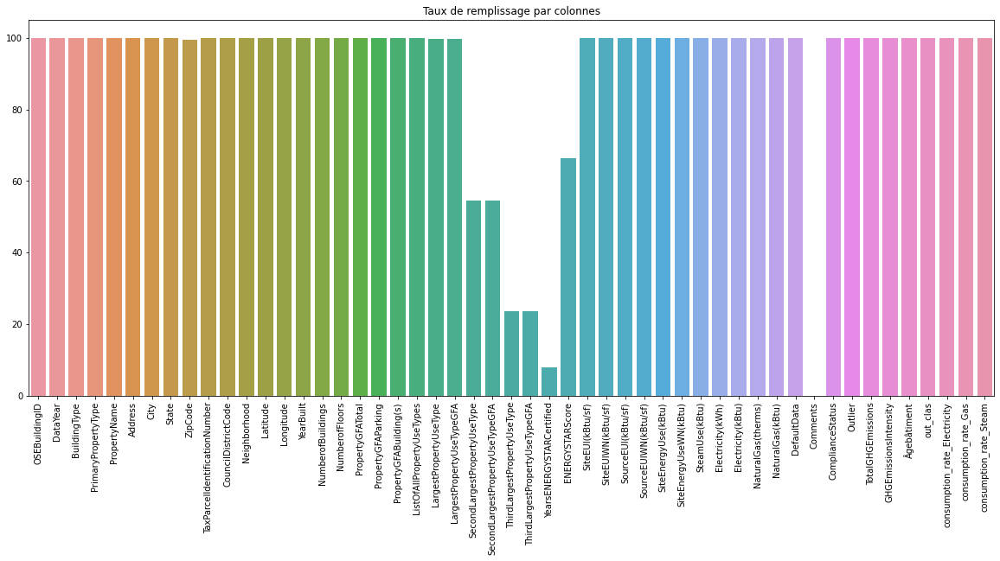

In [53]:
# III-1-10 Taux de remplissage des colonnes du dataset réaménagé.
nb_row=data.shape[0]
taux=data.apply(lambda x:(x.notna().sum()/nb_row)*100)
columns=data.columns
# Représentation graphique du taux de remplissage des colonnes du dataset.
plt.figure(figsize=(20,8))
plt.xticks(rotation=90)
sns.barplot(x=columns,y=taux)

plt.title('Taux de remplissage par colonnes')
plt.show()

In [54]:
# III-2 NETTOYAGE DES DONNEES.
# III-2-1 Imputation par KNN sur "ENERGYSTARScore".
data_train = data.loc[data['ENERGYSTARScore'].notnull(),]
data_test = data.loc[data['ENERGYSTARScore'].isnull(),]

In [55]:
# III-2-1-1 Pour les x_train, je prends les variables énergétiques, sans les variables cibles, car utiliser la Target pour compléter les valeurs manquantes d'une variable puis le reprendre, peut causer la fuite de données.
train , test = train_test_split(data_train, test_size = 0.3)

x_train = train[['SiteEUI(kBtu/sf)',
       'SourceEUI(kBtu/sf)','SiteEnergyUse(kBtu)','SteamUse(kBtu)',
       'Electricity(kBtu)','NaturalGas(kBtu)',
       'GHGEmissionsIntensity']]
           
y_train = train['ENERGYSTARScore']

x_test = test[['SiteEUI(kBtu/sf)',
       'SourceEUI(kBtu/sf)','SiteEnergyUse(kBtu)','SteamUse(kBtu)',
       'Electricity(kBtu)','NaturalGas(kBtu)',
       'GHGEmissionsIntensity']]
y_test = test['ENERGYSTARScore']
x_predict = data_test[['SiteEUI(kBtu/sf)',
       'SourceEUI(kBtu/sf)','SiteEnergyUse(kBtu)','SteamUse(kBtu)',
       'Electricity(kBtu)','NaturalGas(kBtu)',
       'GHGEmissionsIntensity']]

In [56]:
# III-2-1-2 Déterminer le RMSE.
rmse_val = [] 
for K in range(20):
    K = K+1
    model = neighbors.KNeighborsRegressor(n_neighbors = K)

    model.fit(x_train, y_train) 
    pred=model.predict(x_test)
    error = sqrt(mean_squared_error(y_test,pred))
    rmse_val.append(error)
    print('RMSE value for k= ' , K , 'is:', error)

RMSE value for k=  1 is: 38.310656768298145
RMSE value for k=  2 is: 34.025152595900465
RMSE value for k=  3 is: 31.618206925350968
RMSE value for k=  4 is: 29.98674210104963
RMSE value for k=  5 is: 29.25669060153811
RMSE value for k=  6 is: 28.785789672232834
RMSE value for k=  7 is: 28.305293936943464
RMSE value for k=  8 is: 28.15792924484679
RMSE value for k=  9 is: 27.830837194091025
RMSE value for k=  10 is: 27.72821568284062
RMSE value for k=  11 is: 27.792364018976283
RMSE value for k=  12 is: 27.690142852882644
RMSE value for k=  13 is: 27.22256503963721
RMSE value for k=  14 is: 27.1337852156875
RMSE value for k=  15 is: 27.020458515528535
RMSE value for k=  16 is: 27.081777662037055
RMSE value for k=  17 is: 27.164965803976308
RMSE value for k=  18 is: 26.957604214083815
RMSE value for k=  19 is: 26.8803861622706
RMSE value for k=  20 is: 26.760043985921254


<AxesSubplot:>

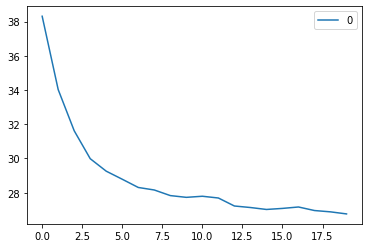

In [57]:
# III-2-1-3 Courbe RMSE DES VALEURS DE K.
curve = pd.DataFrame(rmse_val)
curve.plot()

In [58]:
# III-2-1-4 Sélection pour K=20.
model = neighbors.KNeighborsRegressor(n_neighbors = 20)

In [59]:
# III-2-1-5 Estimation du modèle.
model.fit(x_train, y_train)

KNeighborsRegressor(n_neighbors=20)

In [60]:
# III-2-1-6 Prédiction du modèle.
pred_ENERGYSTARScore = model.predict(x_predict)

In [61]:
# III-2-1-7 Remplacer les valeurs manquantes de la variable 'ENERGYSTARScore' par ses valeurs prédites.
data.loc[data['ENERGYSTARScore'].isnull(), 'ENERGYSTARScore'] = pred_ENERGYSTARScore

In [62]:
# III-2-1-8 Vérifier que la variable 'ENERGYSTARScore' est désormais sans valeur manquante.
data['ENERGYSTARScore'].isnull().sum()

0

In [63]:
# III-2-2 Conservation des variables avec moins de 50% de valeurs manquantes.
data = data[data.columns[data.isna().sum()/data.shape[0] < 0.5]]

In [64]:
# III-2-3 Suppression des variables de la Source principale d'énergie.
data.drop(["Electricity(kBtu)","NaturalGas(kBtu)","SteamUse(kBtu)"], axis=1, inplace = True)

In [65]:
# III-2-4 Informations contenues dans le dataset réaménagé. 
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1093 entries, 0 to 3375
Data columns (total 44 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    1093 non-null   int64  
 1   DataYear                         1093 non-null   int64  
 2   BuildingType                     1093 non-null   object 
 3   PrimaryPropertyType              1093 non-null   object 
 4   PropertyName                     1093 non-null   object 
 5   Address                          1093 non-null   object 
 6   City                             1093 non-null   object 
 7   State                            1093 non-null   object 
 8   ZipCode                          1087 non-null   float64
 9   TaxParcelIdentificationNumber    1093 non-null   object 
 10  CouncilDistrictCode              1093 non-null   int64  
 11  Neighborhood                     1093 non-null   object 
 12  Latitude            

In [66]:
# III-2-5 Suppression des variables non pertinentes pour notre étude.
data.drop(["PropertyName", "City", "State","YearBuilt","SecondLargestPropertyUseType","SecondLargestPropertyUseTypeGFA","DefaultData","Outlier","NaturalGas(therms)"], axis=1, inplace = True)

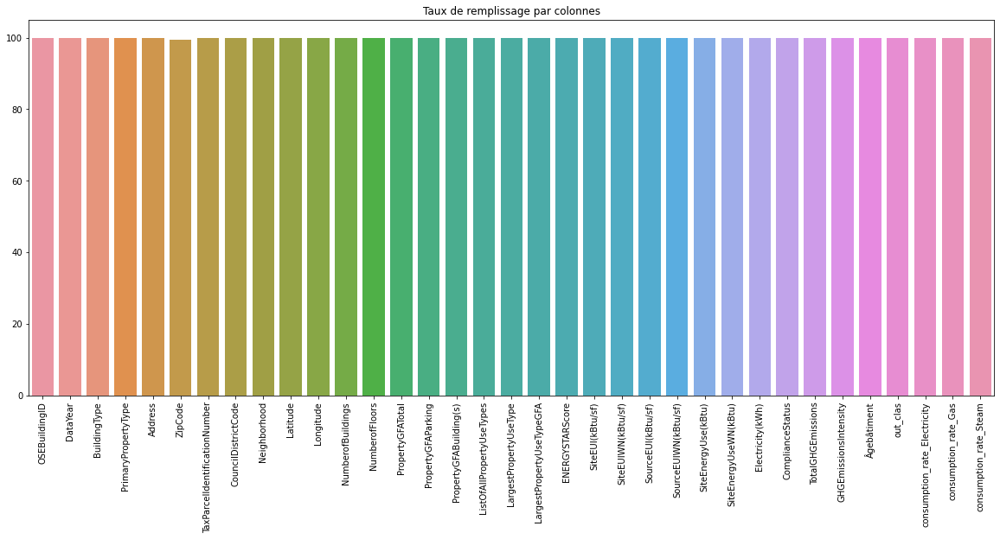

In [67]:
# III-2-6 Taux de remplissage des colonnes du dataset réajusté.
nb_row=data.shape[0]
taux=data.apply(lambda x:(x.notna().sum()/nb_row)*100)
columns=data.columns
plt.figure(figsize=(20,8))
plt.xticks(rotation=90)
sns.barplot(x=columns,y=taux)

plt.title('Taux de remplissage par colonnes')
plt.show()

In [68]:
# III-2-7 Nous usiterons des variables normalisées par la météo (WN). Nous supprimerons les variables non normalisées (Sans WN).
data = data.drop(['SiteEUI(kBtu/sf)','SourceEUI(kBtu/sf)','SiteEnergyUse(kBtu)'], axis=1)

In [69]:
# III-2-8 Identification des valeurs négatives des différentes variables du dataset réajusté.
data.min()

OSEBuildingID                                      1
DataYear                                        2016
BuildingType                                  Campus
PrimaryPropertyType              Distribution Center
Address                                100 4th Ave N
ZipCode                                      98006.0
TaxParcelIdentificationNumber             0001800033
CouncilDistrictCode                                1
Neighborhood                                 BALLARD
Latitude                                    47.49917
Longitude                                 -122.40836
NumberofBuildings                                0.0
NumberofFloors                                     0
PropertyGFATotal                               12769
PropertyGFAParking                                 0
PropertyGFABuilding(s)                          3636
ListOfAllPropertyUseTypes            Adult Education
LargestPropertyUseTypeGFA                     5656.0
ENERGYSTARScore                               

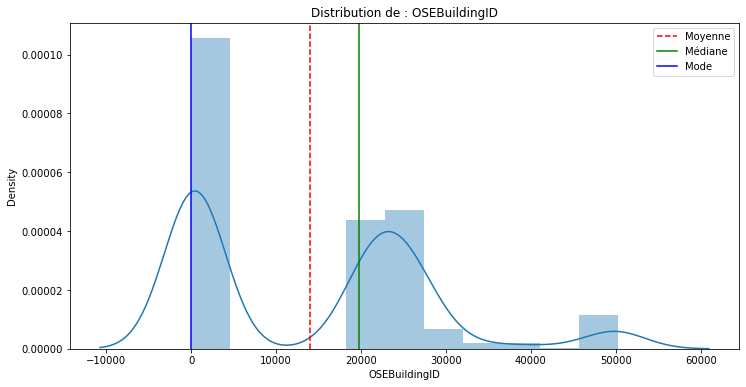

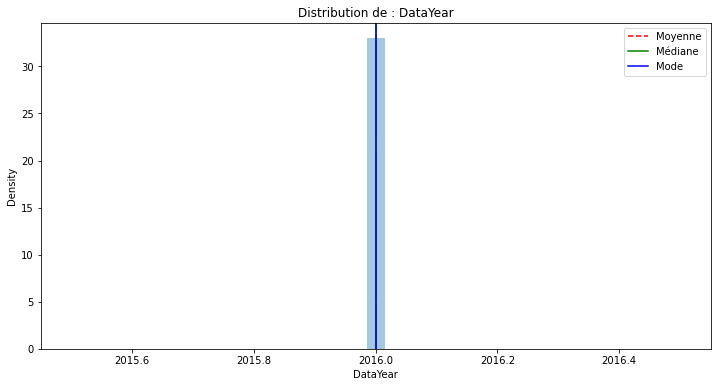

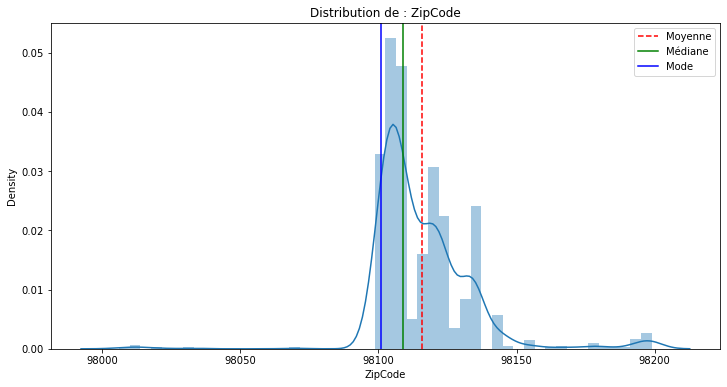

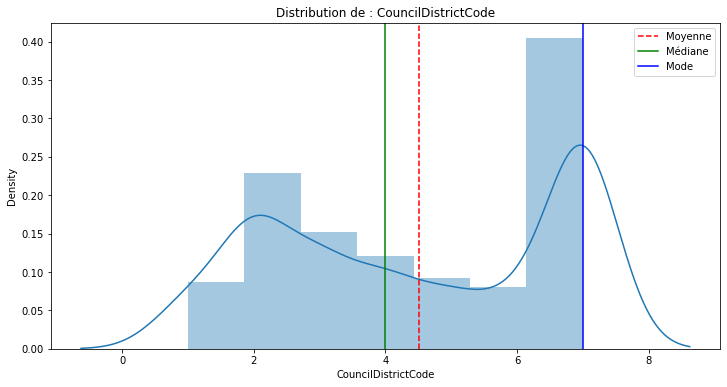

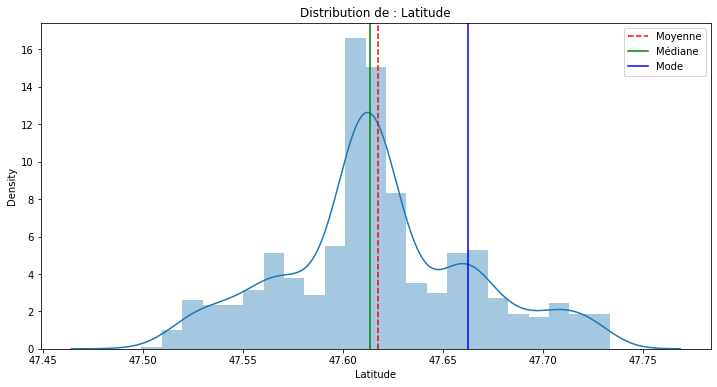

...

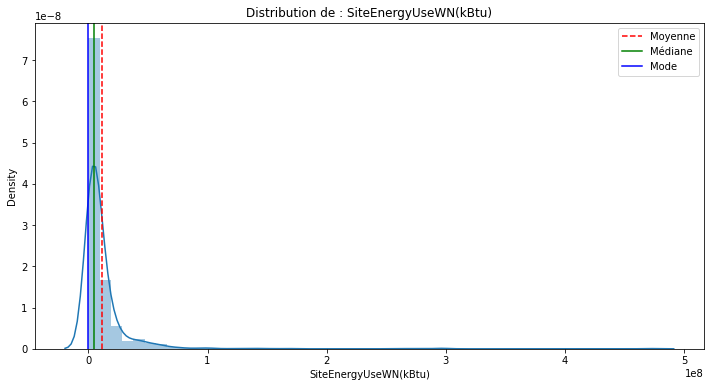

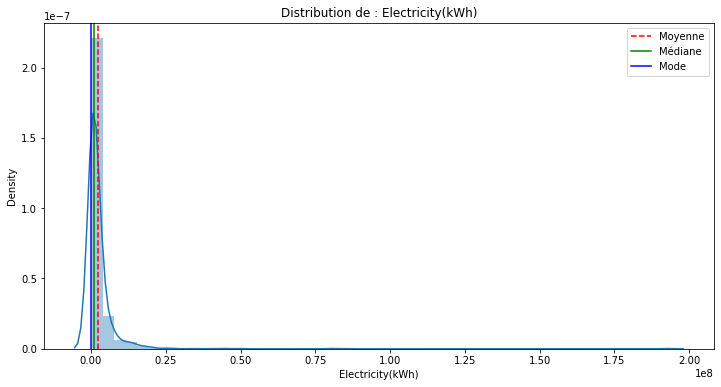

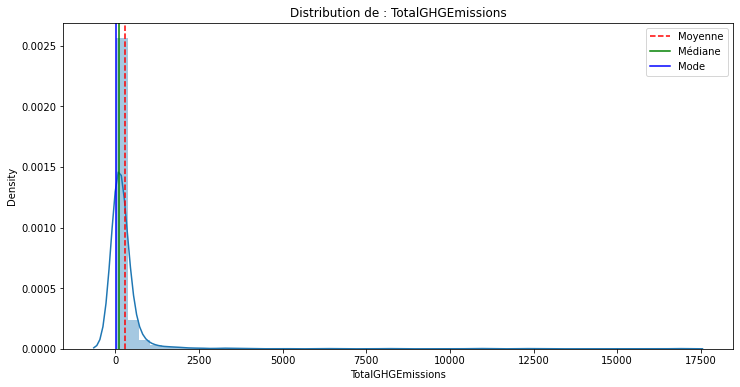

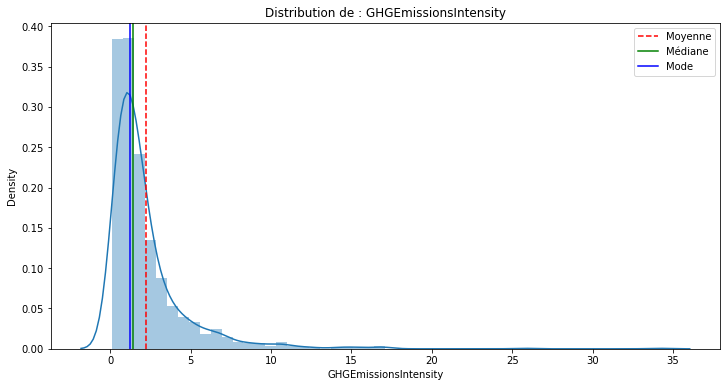

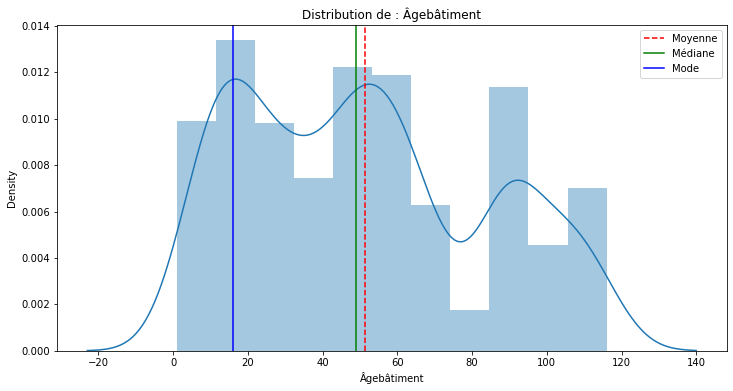

In [70]:
# IV-DISTRIBUTION & GRANDEURS STATISTIQUES DES VARIABLES DU DATASET.
# IV-1 DISTRIBUTION & GRANDEURS STATISTIQUES DES VARIABLES NUMERIQUES DU DATASET.
# IV-1-1 DISTRIBUTION DES VARIABLES NUMERIQUES DU DATASET.
for col in data.select_dtypes("number"):
    plt.figure(figsize = (12,6))
    sns.distplot(data[col])
    plt.axvline(data[col].mean(), color='r', linestyle='--', label="Moyenne")
    plt.axvline(data[col].median(), color='g', linestyle='-', label="Médiane")
    plt.axvline(data[col].mode().values[0], color='b', linestyle='-', label="Mode")
    chaine = 'Distribution de : ' + col
    plt.title(chaine)
    plt.legend()
    plt.show()

In [71]:
# IV-1-2 Fonction qui définit les statistiques des variables numériqes du dataset.
def descriptives_stat(dataframe, liste_variables):

    liste_mean = ['moyenne']
    liste_median = ['médiane']
    liste_var = ['variance']
    liste_std = ['écart-type']
    liste_skew = ["skewness : mesure d'asymétrie"]
    liste_kurtosis = ["kurtosis: mesure d'aplatissement"]
    liste_mode = ['mode']
    liste_cols = ['Desc']
    liste_max = ['max']
    liste_min = ['min']
    liste_count = ['count']

    for col in liste_variables:
        liste_mean.append(dataframe[col].mean())
        liste_median.append(dataframe[col].median())
        liste_var.append(dataframe[col].var(ddof=0))
        liste_std.append(dataframe[col].std(ddof=0))
        liste_skew.append(dataframe[col].skew())
        liste_kurtosis.append(dataframe[col].kurtosis())
        liste_cols.append(col)
        liste_mode.append(dataframe[col].mode().values[0])
        liste_min.append(dataframe[col].min())
        liste_max.append(dataframe[col].max())
        liste_count.append(dataframe[col].count())

    data_stats = [liste_count, liste_mean, liste_std, liste_median, liste_min, liste_var,  liste_skew,
                  liste_kurtosis, liste_mode, liste_max]
    df_stat = pd.DataFrame(data_stats, columns=liste_cols)
    
    return df_stat.style.hide_index()

In [72]:
# IV-1-3 Application de la fonction.
descriptives_stat(data,data.select_dtypes("number"))

Desc,OSEBuildingID,DataYear,ZipCode,CouncilDistrictCode,Latitude,Longitude,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUIWN(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUseWN(kBtu),Electricity(kWh),TotalGHGEmissions,GHGEmissionsIntensity,Âgebâtiment
count,1093.000000,1093.000000,1087.000000,1093.000000,1093.000000,1093.000000,1093.000000,1093.000000,1093.000000,1093.000000,1093.000000,1091.000000,1093.000000,1092.000000,1093.000000,1092.000000,1093.000000,1093.000000,1093.000000,1093.000000
moyenne,13994.471180,2016.000000,98115.876725,4.506862,47.617604,-122.332873,1.248856,4.941446,156992.289113,18325.394328,138666.894785,129407.424381,63.167063,94.449267,217.441995,11548529.866702,2418765.362851,273.254840,2.229790,51.366880
écart-type,14476.219785,0.000000,18.543801,2.193144,0.047362,0.024231,3.604449,7.343628,358472.299223,50996.157196,343548.813101,335277.517878,23.805886,83.142216,209.423772,26494981.296265,7411641.747838,915.484425,2.639364,32.348145
médiane,19752.000000,2016.000000,98109.000000,4.000000,47.613390,-122.333220,1.000000,3.000000,64893.000000,0.000000,60000.000000,56747.000000,65.750000,68.500000,159.100006,5086975.250000,878757.312500,95.030000,1.420000,49.000000
min,1.000000,2016.000000,98006.000000,1.000000,47.499170,-122.408360,0.000000,0.000000,12769.000000,0.000000,3636.000000,5656.000000,1.000000,0.000000,0.000000,0.000000,1.000000,29.440000,0.130000,1.000000
variance,209560939.272042,0.000000,343.872568,4.809880,0.002243,0.000587,12.992050,53.928868,128502389310.028015,2600608048.731036,118025786982.965195,112411013994.462387,566.720210,6912.628084,43858.316300,701984033889408.375000,54932433398301.632812,838111.732133,6.966242,1046.402453
skewness : mesure d'asymétrie,0.643189,0.000000,0.989311,-0.112415,0.197646,0.038543,26.549303,4.282946,16.322818,4.218916,18.369731,19.634776,-0.768910,3.381093,4.642070,9.524267,17.381985,11.714371,4.220660,0.342922
kurtosis: mesure d'aplatissement,-0.369067,0.000000,9.755433,-1.551885,-0.084471,0.924361,791.079663,23.685778,393.369799,22.873333,469.348493,519.532325,0.205103,17.451344,36.862817,124.325110,410.481452,166.004583,30.674148,-1.008519
mode,1.000000,2016.000000,98101.000000,7.000000,47.662460,-122.298980,1.000000,1.000000,36000.000000,0.000000,36000.000000,30000.000000,89.000000,0.000000,0.000000,0.000000,1.000000,30.220000,1.200000,16.000000
max,50226.000000,2016.000000,98199.000000,7.000000,47.733680,-122.258640,111.000000,76.000000,9320156.000000,512608.000000,9320156.000000,9320156.000000,100.000000,834.400024,2620.000000,471613856.000000,192577488.000000,16870.980000,34.090000,116.000000


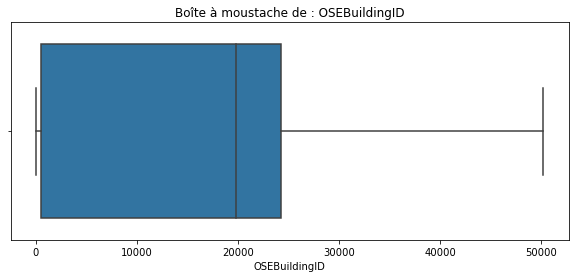

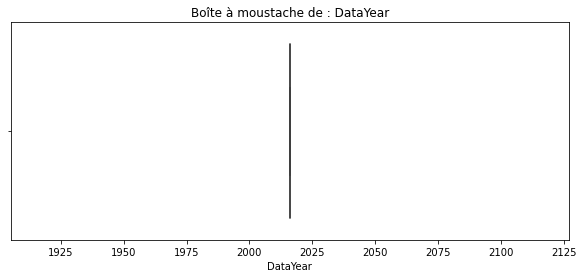

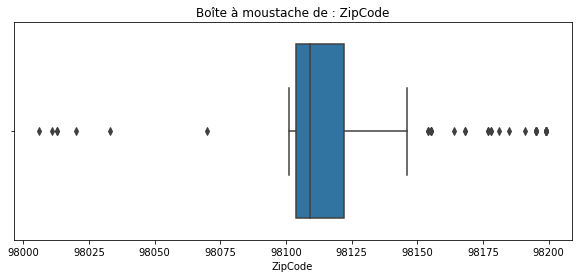

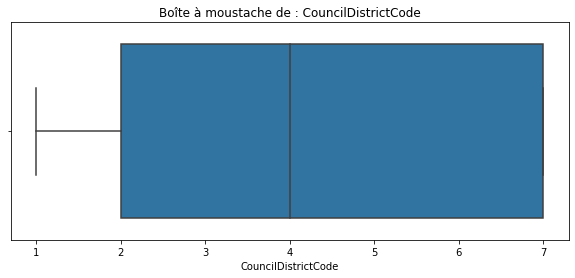

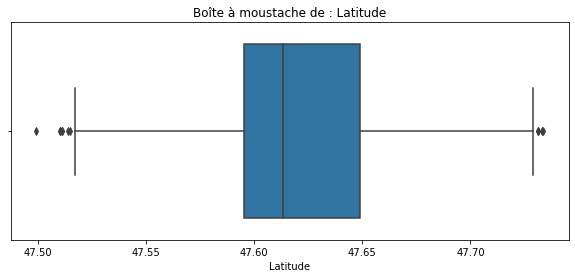

...

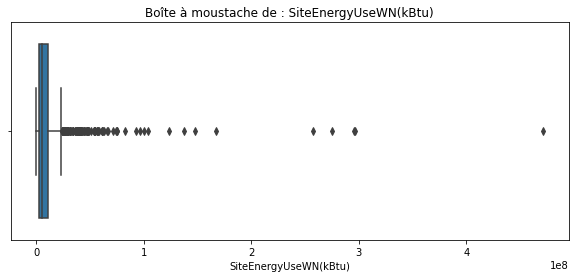

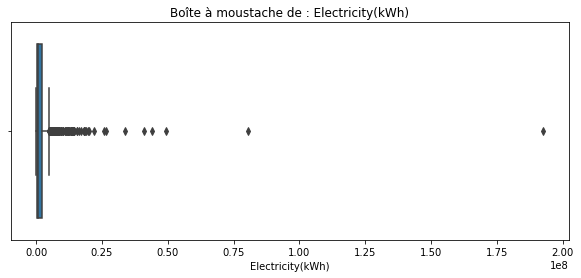

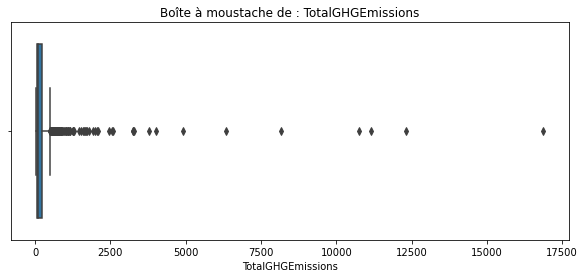

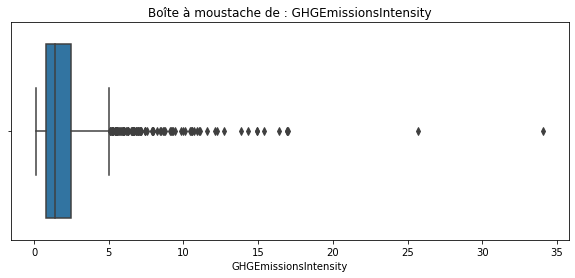

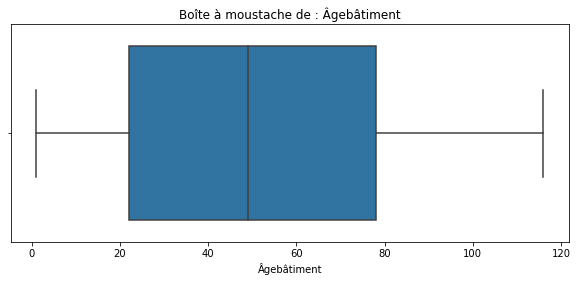

In [73]:
# IV-1-4 DISTRIBUTION BOXPLOT DES FEACTURES ENGINEERING NUMERIQUES DU DATASET.
for col in data.select_dtypes("number"):
    plt.figure(figsize = (10,4))
    sns.boxplot(data[col])
    chaine = 'Boîte à moustache de : ' + col
    plt.title(chaine)
    plt.show()

In [74]:
# IV-2 DISTRIBUTION & GRANDEURS STATISTIQUES DES VARIABLES CATEGORIELLES DU DATASET.
# IV-2-1 VARIABLES CATEGORIELLES DU DATASET.
categorical = data.select_dtypes("object").columns.tolist()
# Visualisation des variables catégorielles.
categorical

['BuildingType',
 'PrimaryPropertyType',
 'Address',
 'TaxParcelIdentificationNumber',
 'Neighborhood',
 'ListOfAllPropertyUseTypes',
 'LargestPropertyUseType',
 'ComplianceStatus',
 'out_clas',
 'consumption_rate_Electricity',
 'consumption_rate_Gas',
 'consumption_rate_Steam']

In [75]:
# IV-2-2 ANALYSE DES VARIABLES CATEGORIELLES.
# IV-2-2-1 Nous avons déjà analysé la variable 'BuildingType' dont les composantes sont (Voir graphique3).
data['BuildingType'].value_counts().sort_values(ascending=False)

NonResidential        941
SPS-District K-12      70
Nonresidential COS     59
Campus                 23
Name: BuildingType, dtype: int64

In [76]:
# IV-2-2-2 Analyse de la variable 'PrimaryPropertyType'.
data['PrimaryPropertyType'].value_counts().sort_values(ascending=False)

Other                          188
Large Office                   167
Small- and Mid-Sized Office    129
K-12 School                    105
Warehouse                       76
Mixed Use Property              74
Hotel                           73
Retail Store                    57
Worship Facility                39
Supermarket / Grocery Store     38
Medical Office                  29
Distribution Center             25
Senior Care Community           19
University                      18
Residence Hall                  17
Laboratory                      10
Restaurant                       9
Hospital                         9
Self-Storage Facility            8
Refrigerated Warehouse           3
Name: PrimaryPropertyType, dtype: int64

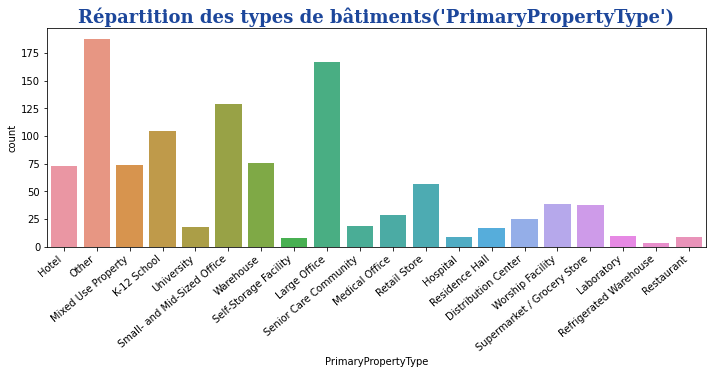

In [77]:
# IV-2-2-2-1 Représentation graphique de la variable 'PrimaryPropertyType'.
plt.figure(figsize=(10,5))
ax=sns.countplot(data=data, x='PrimaryPropertyType')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
ax.set_title("Répartition des types de bâtiments('PrimaryPropertyType')", fontdict=font_title)
plt.savefig('GRAPHS/6- Répart_typeBât')
plt.show()

In [78]:
# IV-2-2-2-2 Regroupement selon la classification de l'Agence de Protection de l'Environnement: Environmental Protection Agency (EPA).
Rename = {'Retail Store' : 'Retail',
                'Supermarket / Grocery Store' : 'Food Sales & Service',
          
                'Restaurant': 'Food Sales & Service',
                'Restaurant\n': 'Food Sales & Service',
          
                'Small- and Mid-Sized Office': 'Office',
                'Large Office': 'Office',  
          
                'Residence Hall': 'Lodging/Residential',
                'Hotel': 'Lodging/Residential',
          
                'Senior Care Community' : 'Healthcare',
                'Hospital': 'Healthcare',
                'Medical Office' : 'Healthcare',
          
                'K-12 School' : 'Education',
                'SPS-District K-12': 'Education',
                'University': 'Education',
                'College/University': 'Education',
                'Laboratory': 'Technology/Science',
          
                'Distribution Center': 'Warehouse/Storage',
                'Self-Storage Facility': 'Warehouse/Storage',
                'Non-Refrigerated Warehouse': 'Warehouse/Storage',
                'Refrigerated Warehouse': 'Warehouse/Storage',
          
                'Worship Facility': 'Public Assembly',
          
                'Low-Rise Multifamily': 'Lodging/Residential',
                'Mixed Use Property': 'Mixed Use'
             
               }

data['PrimaryPropertyType'] = data['PrimaryPropertyType'].replace(Rename)

In [79]:
# IV-2-2-2-3 Analyse de la variable 'PrimaryPropertyType' après le groupement.
data['PrimaryPropertyType'].value_counts().sort_values(ascending=False)

Office                  296
Other                   188
Education               123
Lodging/Residential      90
Warehouse                76
Mixed Use                74
Healthcare               57
Retail                   57
Food Sales & Service     47
Public Assembly          39
Warehouse/Storage        36
Technology/Science       10
Name: PrimaryPropertyType, dtype: int64

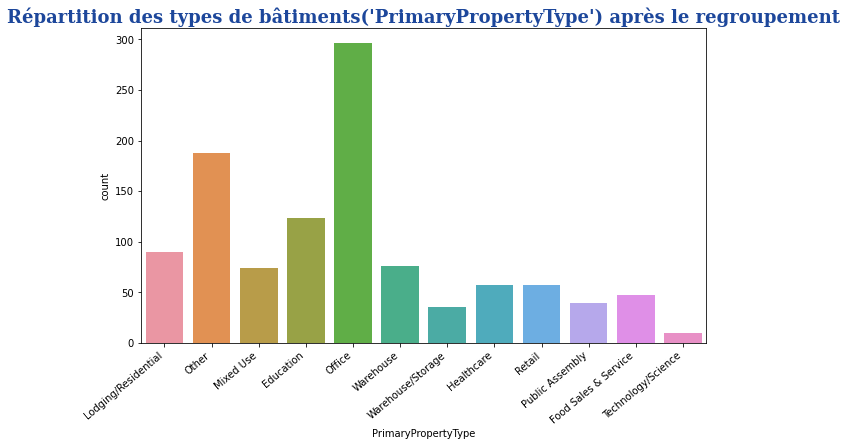

In [80]:
# IV-2-2-2-4 Représentation graphique de la variable 'PrimaryPropertyType' après regroupement.
plt.figure(figsize=(9,6))
ax=sns.countplot(data=data, x='PrimaryPropertyType')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
ax.set_title("Répartition des types de bâtiments('PrimaryPropertyType') après le regroupement", fontdict=font_title)
plt.savefig('GRAPHS/7- Répart_typeBâtAprgr')
plt.show()

In [81]:
# IV-2-2-3 Analyse de la variable 'LargestPropertyUseType'.
data['LargestPropertyUseType'].value_counts().sort_values(ascending=False)

Office                                                  314
K-12 School                                             105
Non-Refrigerated Warehouse                               82
Other                                                    77
Hotel                                                    73
Retail Store                                             62
Worship Facility                                         39
Supermarket/Grocery Store                                38
Medical Office                                           30
Distribution Center                                      26
Other - Recreation                                       25
Parking                                                  22
Senior Care Community                                    19
Residence Hall/Dormitory                                 18
College/University                                       18
Other - Entertainment/Public Assembly                    16
Laboratory                              

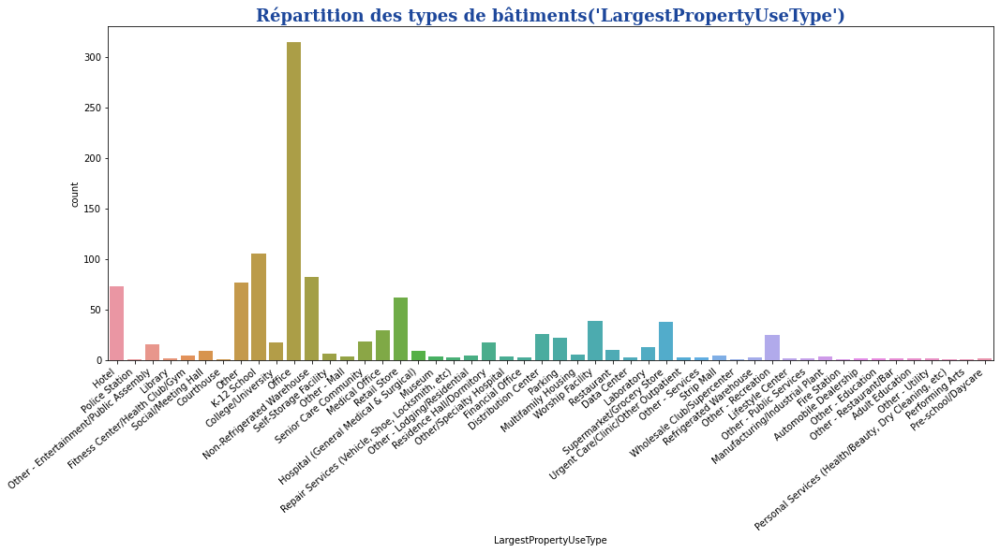

In [82]:
# IV-2-2-3-1 Représentation graphique de la variable 'LargestPropertyUseType'.
plt.figure(figsize=(15,8))
ax=sns.countplot(data=data, x='LargestPropertyUseType')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
ax.set_title("Répartition des types de bâtiments('LargestPropertyUseType')", fontdict=font_title)
plt.savefig('GRAPHS/8- Répart_typeBât2')
plt.show()

In [83]:
# IV-2-2-3-2 Regroupons les.
LargestProperty = {'Retail Store' : 'Retail',
                   'Enclosed Mall': 'Retail',
                   'Automobile Dealership': 'Retail',
                   'Strip Mall': 'Retail',
                   'Other - Mall': 'Retail',
                   
                   'Convenience Store without Gas Station': 'Food Sales & Service',
                   'Wholesale Club/Supercenter': 'Food Sales & Service',
                   'Supermarket/Grocery Store' : 'Food Sales & Service',
                   'Food Sales': 'Food Sales & Service',
                   'Food Service': 'Food Sales & Service',
                   'Other - Restaurant/Bar' : 'Food Sales & Service',
                   'Fast Food Restaurant': 'Food Sales & Service',
                   'Restaurant': 'Food Sales & Service',
                   'Bar/Nightclub': 'Food Sales & Service',
                   
                   'Non-Refrigerated Warehouse': 'Warehouse/Storage',
                   'Refrigerated Warehouse': 'Warehouse/Storage',
                   'Distribution Center': 'Warehouse/Storage',
                   'Self-Storage Facility': 'Warehouse/Storage',
                   
                   'Other - Services' : 'Services',
                   'Other - Public Services': 'Services',
                   'Parking': 'Services',
                   'Repair Services (Vehicle, Shoe, Locksmith, etc)' : 'Services',
                   'Personal Services (Health/Beauty, Dry Cleaning, etc)': 'Services',
                  
                   'Police Station': 'Public Services',
                   'Fire Station': 'Public Services',
                   'Courthouse': 'Public Services',
                   'Library': 'Public Services',
                   'Other - Utility': 'Public Services',
                   
                   'Prison/Incarceration': 'Lodging/Residential',
                   'Multifamily Housing':'Lodging/Residential',
                   'Other - Lodging/Residential': 'Lodging/Residential',
                   'Residence Hall/Dormitory': 'Lodging/Residential',
                   'Hotel': 'Lodging/Residential',
                 
                   'Worship Facility': 'Public Assembly',
                   'Other - Recreation': 'Public Assembly',
                   'Other - Entertainment/Public Assembly': 'Public Assembly',
                   'Performing Arts': 'Public Assembly',
                   'Movie Theater': 'Public Assembly',
                   'Museum': 'Public Assembly',
                   'Social/Meeting Hall':'Public Assembly',
                   'Fitness Center/Health Club/Gym': 'Public Assembly',
                   'Convention Center': 'Public Assembly',
                   'Lifestyle Center': 'Public Assembly',
                   
                   'Senior Care Community' : 'Healthcare',
                   'Residential Care Facility' : 'Healthcare',
                   'Outpatient Rehabilitation/Physical Therapy' : 'Healthcare',
                   'Medical Office' : 'Healthcare',
                   'Urgent Care/Clinic/Other Outpatient' : 'Healthcare',
                   'Other/Specialty Hospital' : 'Healthcare',
                   'Hospital (General Medical & Surgical)' :'Healthcare',
                   
                   'Laboratory': 'Technology/Science',
                   'Data Center': 'Technology/Science',

                   'Bank Branch' : 'Financial Office',
                   'Financial Office' : 'Financial Office',

                   'K-12 School' : 'Education',
                   'Other - Education': 'Education',
                   'Vocational School' : 'Education', 
                   'Adult Education' : 'Education',
                   'Pre-school/Daycare': 'Education',
                   'University': 'Education',
                   'College/University': 'Education'}

data['LargestPropertyUseType'] = data['LargestPropertyUseType'].replace(LargestProperty )

In [84]:
# IV-2-2-3-3 Analyse de la variable 'LargestPropertyUseType' après regroupement.
data['LargestPropertyUseType'].value_counts().sort_values(ascending=False)

Office                            314
Education                         129
Warehouse/Storage                 118
Lodging/Residential               102
Public Assembly                   101
Other                              77
Retail                             73
Healthcare                         65
Food Sales & Service               51
Services                           31
Technology/Science                 16
Public Services                     7
Manufacturing/Industrial Plant      4
Financial Office                    3
Name: LargestPropertyUseType, dtype: int64

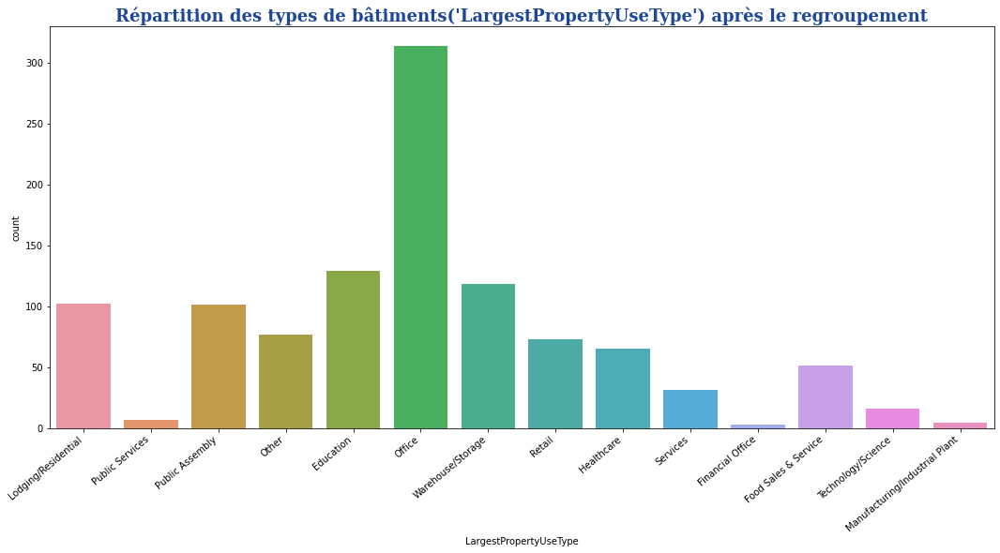

In [85]:
# IV-2-2-3-4 Représentation graphique de la variable 'LargestPropertyUseType' après regroupement.
plt.figure(figsize=(15,8))
ax=sns.countplot(data=data, x='LargestPropertyUseType')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
ax.set_title("Répartition des types de bâtiments('LargestPropertyUseType') après le regroupement", fontdict=font_title)
plt.savefig('GRAPHS/9- Répart_typeBâtAprgr2')
plt.show()

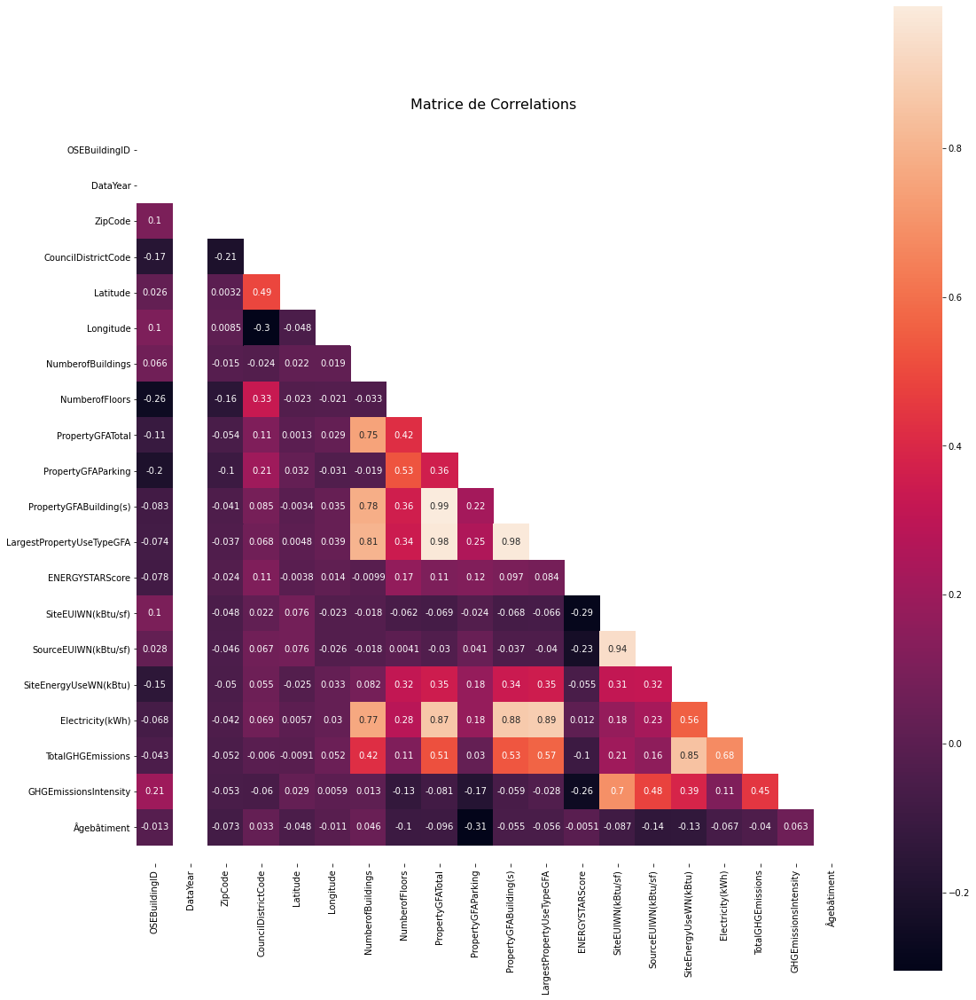

In [86]:
# V CORRELATION LINEAIRE DES DONNEES NUMERIQUES.
# V-1 Heatmap de la matrice des corrélation des variables du dataset réajusté.
corr_matrix=data.corr()
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(18, 20))
sns.heatmap(corr_matrix, mask=mask, square=True,annot=True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.title('Matrice de Correlations',fontsize=16)
plt.savefig('GRAPHS/6- Matrice_Corr')
plt.show()

In [87]:
# V-2 Analyse des résulTats des corrélations.
# On peut observer des corrélations importantes entre:
# 1.SiteEnergyUseWN(kBtu) et TotalGHEmissions;
# 2 SiteEUIWN(kBtu/sf) et SourceEUIWN(kBtu/sf);
# 3.LargestPropertyUseTypeGFA et Electricity(kWh);
# 4.PropertyGFABuilding(s) et Electricity(kWh);PropertyGFABuilding(s) et LargestPropertyUseTypeGFA;
# 5.PropertyGFATotal et Electricity(kWh);PropertyGFATotal et LargestPropertyUseTypeGFA;PropertyGFATotal et PropertyGFABuilding(s);
# 6.NumberofBuildings et Electricity(kWh);NumberofBuildings et LargestPropertyUseTypeGFA;NumberofBuildings et PropertyGFABuilding(s);NumberofBuildings et PropertyGFATotal;

In [88]:
# Les fortes corrélations visibles sur le heatmap peuvent am7ner des problèmes de colinéarité dans nos futurs modèles.
# V-3 Isolons donc les paires de variables avec des corrélations de Pearson supérieurs à 0.7.
threshold = 0.7
corr_pairs = corr_matrix.unstack().sort_values(kind="quicksort")
strong_corr = (pd.DataFrame(corr_pairs[(abs(corr_pairs) > threshold)])
               .reset_index().rename(columns={0:'corr_coeff'}))
strong_corr = strong_corr[(strong_corr.index%2 == 0) & (strong_corr['level_0'] != strong_corr['level_1'])]
strong_corr.sort_values('corr_coeff', ascending=False)

,level_0,level_1,corr_coeff
22,PropertyGFATotal,PropertyGFABuilding(s),0.990346
20,LargestPropertyUseTypeGFA,PropertyGFABuilding(s),0.982501
18,LargestPropertyUseTypeGFA,PropertyGFATotal,0.977860
16,SiteEUIWN(kBtu/sf),SourceEUIWN(kBtu/sf),0.942960
14,LargestPropertyUseTypeGFA,Electricity(kWh),0.887797
12,PropertyGFABuilding(s),Electricity(kWh),0.876833
10,Electricity(kWh),PropertyGFATotal,0.865489
8,SiteEnergyUseWN(kBtu),TotalGHGEmissions,0.853192
6,NumberofBuildings,LargestPropertyUseTypeGFA,0.808038
4,PropertyGFABuilding(s),NumberofBuildings,0.783293


In [89]:
# On remarque que les variables suffixées GFA présentent de fortes corrélations avec plusieurs autres variables.
# V-4 Création de nouvelles variables pour tenter de gommer ces fortes corrélations linéaires.

In [90]:
# V-4-1 Convertion les différentes surfaces (Buildings et Parking) en pourcentage de la surface totale et nous conserverons uniquement ces 2 variables.
data['GFABuildingRate'] = (round((data['PropertyGFABuilding(s)'].fillna(0)
                                  /data['PropertyGFATotal'].fillna(0)),5))
data['GFAParkingRate'] = (round((data['PropertyGFAParking'].fillna(0)
                                 /data['PropertyGFATotal'].fillna(0)),5))

# V-4-2 On supprime les variables inutiles
data.drop(['LargestPropertyUseTypeGFA', 
           'PropertyGFAParking',
           'PropertyGFABuilding(s)'],
         axis=1, inplace=True)

In [91]:
# V-4-3 Calcul de la surface moyenne par bâtiment et par étage.
data['GFAPerBuilding'] = round((data['PropertyGFATotal'] / data['NumberofBuildings']),3)
data['GFAPerFloor'] = round((data['PropertyGFATotal'] / data['NumberofFloors']),3)

In [92]:
# V-5 Identification des constituants de la variable 'Neighborhood'.
data['Neighborhood'].unique()

array(['DOWNTOWN', 'SOUTHEAST', 'NORTHEAST', 'EAST', 'NORTH',
       'LAKE UNION', 'GREATER DUWAMISH', 'MAGNOLIA / QUEEN ANNE',
       'BALLARD', 'NORTHWEST', 'CENTRAL', 'SOUTHWEST', 'DELRIDGE',
       'North', 'Delridge', 'Northwest', 'Ballard', 'Central'],
      dtype=object)

In [93]:
# V-5-1 Remplacement de la variable 'DELRIDGE NEIGHBORHOODS' par 'DELRIDGE'.
data['Neighborhood'].replace('DELRIDGE NEIGHBORHOODS', 'DELRIDGE', inplace=True)
data['Neighborhood']=data['Neighborhood'].map(lambda x: x.upper())

In [94]:
# V-5-2 Nouvelle identification des constituants de la variable 'Neighborhood'.
data['Neighborhood'].unique()

array(['DOWNTOWN', 'SOUTHEAST', 'NORTHEAST', 'EAST', 'NORTH',
       'LAKE UNION', 'GREATER DUWAMISH', 'MAGNOLIA / QUEEN ANNE',
       'BALLARD', 'NORTHWEST', 'CENTRAL', 'SOUTHWEST', 'DELRIDGE'],
      dtype=object)

In [95]:
# V-6 Suppression des valeurs manquantes des variables target:'SiteEnergyUseWN(kBtu)' et 'TotalGHGEmissions'.
data = data[~((data['SiteEnergyUseWN(kBtu)'].isnull()) | (data['TotalGHGEmissions'].isnull()))]

In [96]:
# V-6-1 Détection des valeurs nulles de la variable target 'SiteEnergyUseWN(kBtu)'.
data.loc[data['SiteEnergyUseWN(kBtu)']==0]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,NumberofBuildings,NumberofFloors,PropertyGFATotal,ListOfAllPropertyUseTypes,LargestPropertyUseType,ENERGYSTARScore,SiteEUIWN(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUseWN(kBtu),Electricity(kWh),ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity,Âgebâtiment,out_clas,consumption_rate_Electricity,consumption_rate_Gas,consumption_rate_Steam,GFABuildingRate,GFAParkingRate,GFAPerBuilding,GFAPerFloor
220,343,2016,NonResidential,Office,801 2nd Ave Suite 1300,98104.0,0939000355,7,DOWNTOWN,47.60370,-122.33447,1.0,17,378525,"Office, Parking",Office,69.0,0.0,0.0,0.0,4.098788e+06,Compliant,940.47,2.48,58,Low,High Usage,Low Usage,High Usage,0.77650,0.22350,378525.000,22266.176
247,372,2016,NonResidential,Office,1730 Minor Avenue,98101.0,0660002410,7,DOWNTOWN,47.61695,-122.32965,1.0,20,497513,"Office, Parking",Office,65.0,0.0,0.0,0.0,7.796691e+06,Compliant,197.19,0.40,28,Low,High Usage,High Usage,Low Usage,0.76132,0.23868,497513.000,24875.650
284,414,2016,NonResidential,Office,1411 4TH AVE,98101.0,1975700345,7,DOWNTOWN,47.60923,-122.33625,1.0,15,151039,Office,Office,84.0,0.0,0.0,0.0,7.610041e+05,Compliant,238.09,1.58,87,Low,High Usage,Low Usage,High Usage,1.00000,0.00000,151039.000,10069.267
3274,49967,2016,Campus,Education,NE 45th St & Brooklyn Ave,98105.0,1625049001,4,NORTHEAST,47.65644,-122.31041,111.0,0,9320156,College/University,Education,63.8,0.0,0.0,0.0,1.925775e+08,Compliant,11140.56,1.20,116,Low,High Usage,Low Usage,High Usage,1.00000,0.00000,83965.369,inf
3277,49972,2016,NonResidential,Education,3785 E Stevens Way NE,98195.0,1625049001,4,NORTHEAST,47.65356,-122.30613,1.0,6,203030,College/University,Education,67.2,0.0,0.0,0.0,8.386464e+06,Compliant,199.48,0.98,18,Low,High Usage,Low Usage,Low Usage,1.00000,0.00000,203030.000,33838.333


In [97]:
# V-6-2 Suppression des valeurs nulles de la variable 'SiteEnergyUseWN(kBtu)'
data = data[~(data['SiteEnergyUseWN(kBtu)'] ==0)]

In [98]:
# VI-ANALYSE DES VARIABLES TARGET DU DATASET.
# RQ: Les variables à prédire sont 'TotalGHGEmissions' et 'SiteEnergyUseWN(kBtu).
# Réalisons d'abord une analyse exploratoire sur ces variables avant d'aller plus loin.
# VI-1 Analyse exploratoire des variable cibles:'TotalGHGEmissions' et 'SiteEnergyUseWN(kBtu)..
# VI-1-1 APPliction de la fonction descriptives_stat.
descriptives_stat(data,["TotalGHGEmissions","SiteEnergyUseWN(kBtu)"])

Desc,TotalGHGEmissions,SiteEnergyUseWN(kBtu)
count,1087.000000,1087.000000
moyenne,262.964664,11601650.979244
écart-type,856.469580,26544241.158452
médiane,94.740000,5107519.500000
min,29.440000,746905.625000
variance,733540.141207,704596738678059.375000
skewness : mesure d'asymétrie,12.539417,9.509335
kurtosis: mesure d'aplatissement,195.498471,123.889994
mode,30.220000,2127889.250000
max,16870.980000,471613856.000000


In [99]:
# L'analyse exploratoire permet de faire l'hypothèse que les variables target ne suivent pas la loi normale.
# Nous vérifierons cette hypothèse grâce deux tests de normalité.normaltest, kstest.
for x in ["TotalGHGEmissions","SiteEnergyUseWN(kBtu)"]:
    k2,p = stats.normaltest(data[x])
    print(f"test de normalité de {x}, p = {p}")
    print("-"*70)
    alpha = 1e-3
    if p < alpha:  #  hypothèse nulle: x est une distribution normale
        print(f"L'hypothèse nulle sur {x} peut être rejetée")
        print("-"*70)
    else:
        print(f"L'hypothèse nulle sur {x} peut être rejetée")

test de normalité de TotalGHGEmissions, p = 0.0
----------------------------------------------------------------------
L'hypothèse nulle sur TotalGHGEmissions peut être rejetée
----------------------------------------------------------------------
test de normalité de SiteEnergyUseWN(kBtu), p = 0.0
----------------------------------------------------------------------
L'hypothèse nulle sur SiteEnergyUseWN(kBtu) peut être rejetée
----------------------------------------------------------------------


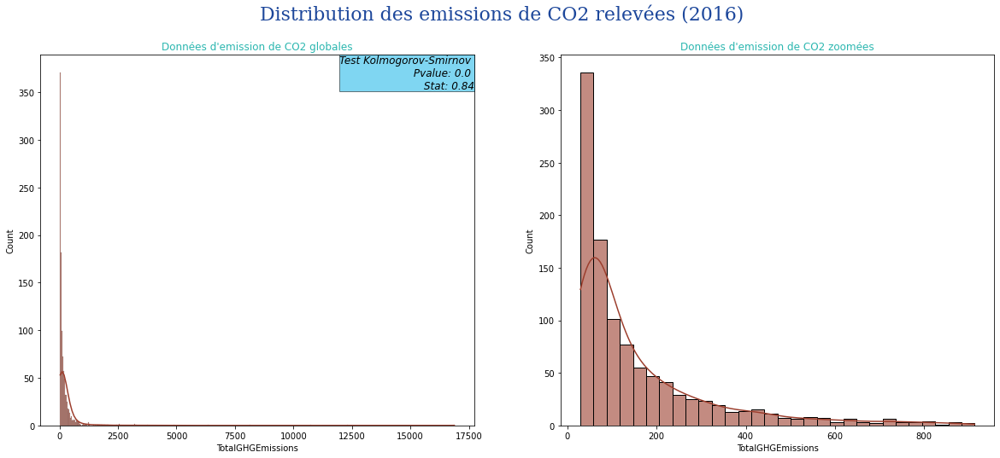

In [100]:
# Analyse exploratoire de la variable cible:'TotalGHGEmissions' avec le test kstest.
fig, axes = plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20,8))
left, width = 0, 1
bottom, height = 0, 1
right = left + width
top = bottom + height

sns.histplot(data=data, x="TotalGHGEmissions", kde=True, ax=axes[0], color="#9C3E2D", alpha=0.6)
axes[0].set_title("Données d'emission de CO2 globales", color='#2cb7b0')

#Test de Kolmogorov-Smirnov
kstest = stats.kstest(data['TotalGHGEmissions'].notnull(),'norm')
axes[0].text(right, top, 'Test Kolmogorov-Smirnov \n Pvalue: {:.2} \n Stat: {:.2}'.format(kstest.pvalue, kstest.statistic),
            horizontalalignment='right',
            verticalalignment='top',
            style='italic', transform=axes[0].transAxes, fontsize = 12,
            bbox={'facecolor':'#00afe6', 'alpha':0.5, 'pad':0})

sns.histplot(data=data[(data['TotalGHGEmissions']< 1000)], x="TotalGHGEmissions", kde=True, ax=axes[1], color="#9C3E2D", alpha=0.6)
axes[1].set_title("Données d'emission de CO2 zoomées", color='#2cb7b0')

plt.suptitle("Distribution des emissions de CO2 relevées (2016)", 
             fontdict=font_title, fontsize=22)
plt.show()

In [101]:
# On observe une forte asymétrie à droite de la distribution de la variable cible 'TotalGHGEmissions'. On doit donc la transformer pour se rapprocher d'une distribution normale.

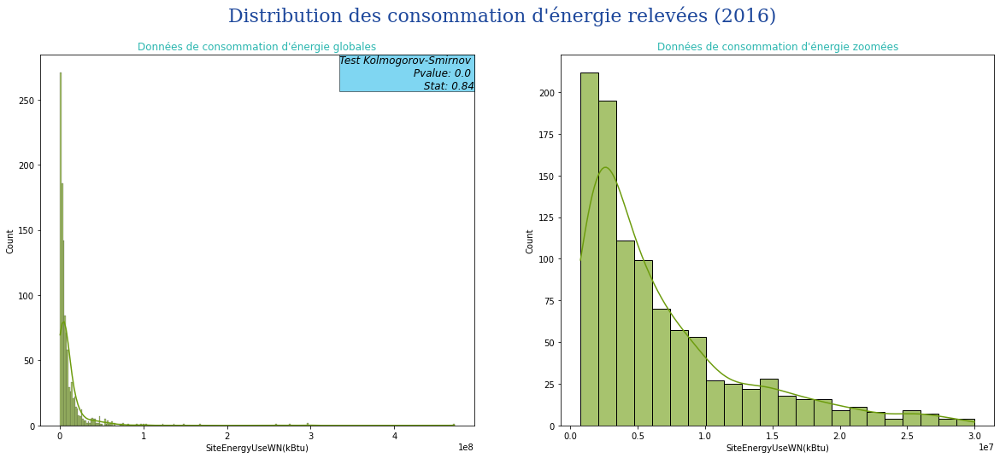

In [102]:
# Analyse exploratoire de la variable cible:'SiteEnergyUseWN(kBtu)' avec le test kstest.
fig, axes = plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20,8))

sns.histplot(data=data, x="SiteEnergyUseWN(kBtu)", kde=True, ax=axes[0], color="#6D9C0E", alpha=0.6)
axes[0].set_title("Données de consommation d'énergie globales", color='#2cb7b0')

#Test de Kolmogorov-Smirnov
kstest = stats.kstest(data['SiteEnergyUseWN(kBtu)'].notnull(),'norm')
axes[0].text(right, top, 'Test Kolmogorov-Smirnov \n Pvalue: {:.2} \n Stat: {:.2}'.format(kstest.pvalue, kstest.statistic),
            horizontalalignment='right',
            verticalalignment='top',
            style='italic', transform=axes[0].transAxes, fontsize = 12,
            bbox={'facecolor':'#00afe6', 'alpha':0.5, 'pad':0})

sns.histplot(data=data[(data['SiteEnergyUseWN(kBtu)']< 0.3*10**8)], x="SiteEnergyUseWN(kBtu)", kde=True, ax=axes[1], color="#6D9C0E", alpha=0.6)
axes[1].set_title("Données de consommation d'énergie zoomées", color='#2cb7b0')

plt.suptitle("Distribution des consommation d'énergie relevées (2016)", 
             fontdict=font_title, fontsize=22)
plt.show()

In [103]:
# On observe une forte asymétrie à droite de la distribution de la variable cible 'SiteEnergyUse(kBtu)'. On doit donc la transformer pour se rapprocher d'une distribution normale.
# RQ: Les projections obtenues et les résultats des tests: normaltest et  de Normalité Kolmogorov-Smirnov (Pvalue <  5%), nous rejettons donc l'hypothèse de normalité des distributions de ces variables cibles.

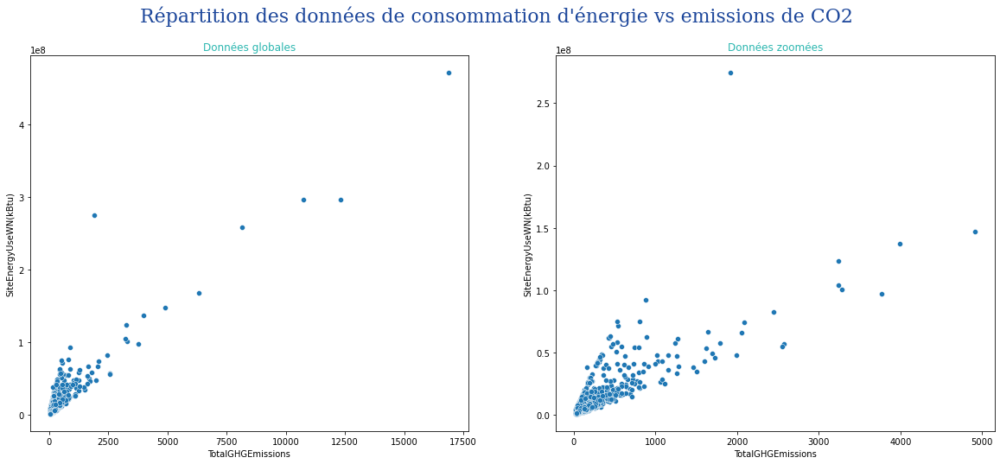

In [104]:
# Analyse bivariée des target entres elles. 
fig, axes = plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20,8))
sns.scatterplot(data=data, x="TotalGHGEmissions", y="SiteEnergyUseWN(kBtu)", ax=axes[0])
axes[0].set_title("Données globales", color='#2cb7b0')
sns.scatterplot(data=data[(data['TotalGHGEmissions'] < 5000)], x="TotalGHGEmissions", y="SiteEnergyUseWN(kBtu)", ax=axes[1])
axes[1].set_title("Données zoomées", color='#2cb7b0')
plt.suptitle("Répartition des données de consommation d'énergie vs emissions de CO2", fontdict=font_title, fontsize=22)
plt.show()

In [105]:
# Il apparaît que les émissions de CO2 augmentent avec la consommation en énergie ce qui était prévisible.
# En plus,nous remarquons que la répartion des données d'emission de CO2 en fonction de la consommation d'énergie suivent au moins deux droites de régression linéaire.

In [106]:
# Analyse multivariée.
# Impact de l'emplacement géographique des bâtiments sur les émissions de CO2 et la consommation d'énergie.
# Coordonnées du centre de Seattle.
seattle_lat = 47.6062
seattle_lon = -122.3321
# Fonction qui calcule la distance haversine.
def haversine_distance(lat1, lng1, lat2, lng2, degrees=True):
    # rayon de la Terre en miles, en kilomètres retourne erreur
    r = 3956 
    if degrees:
        lat1, lng1, lat2, lng2 = map(radians, [lat1, lng1, lat2, lng2])
    # Formule Haversine
    dlng = lng2 - lng1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlng/2)**2
    d = 2 * r * asin(sqrt(a))  

    return d

In [107]:
# Définition de la variable 'harvesine_distance' (Calcul des distances au centre de Seattle pour chaque point).
data['Harvesine_distance'] = [haversine_distance(seattle_lat, seattle_lon, x, y) 
        for x, y in zip(data.Latitude.astype(float), data.Longitude.astype(float))]

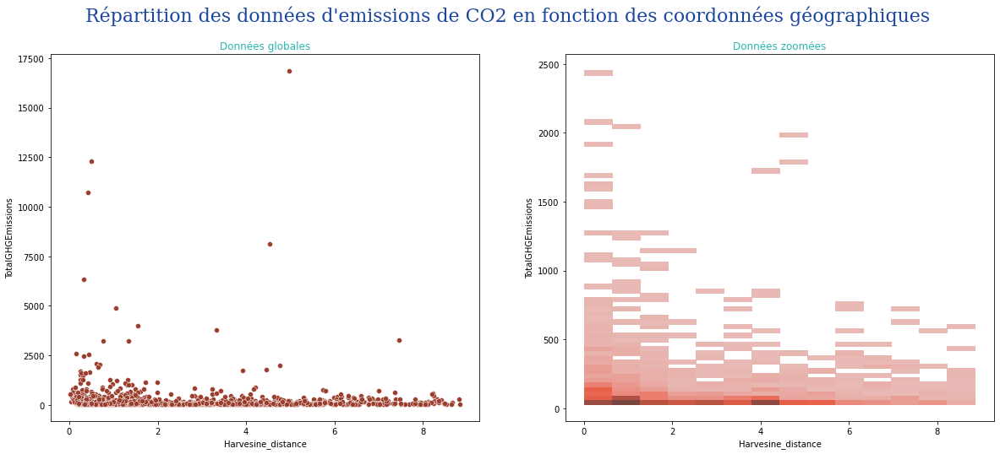

In [108]:
# Répartition des émissions de CO2 en fonction des coordonnées géographiques.
fig, axes = plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20,8))
sns.scatterplot(data=data, y="TotalGHGEmissions", x="Harvesine_distance", color="#9C3E2D", ax=axes[0])
axes[0].set_title("Données globales", color='#2cb7b0')
sns.histplot(data=data[(data['TotalGHGEmissions'] < 2500)], y="TotalGHGEmissions", 
                x="Harvesine_distance", color="#9C3E2D", ax=axes[1])
axes[1].set_title("Données zoomées", color='#2cb7b0')
plt.suptitle("Répartition des données d'emissions de CO2 en fonction des coordonnées géographiques", 
             fontdict=font_title, fontsize=22)
plt.show()

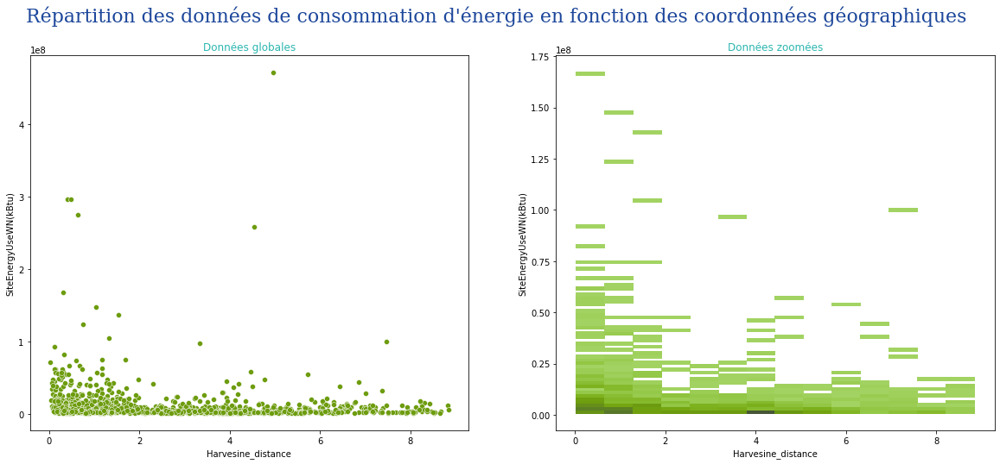

In [109]:
# Répartition de la consommation d'énergie en fonction des coordonnées géographiques.
fig, axes = plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20,8))
sns.scatterplot(data=data, y="SiteEnergyUseWN(kBtu)", x="Harvesine_distance", color="#6D9C0E", ax=axes[0])
axes[0].set_title("Données globales", color='#2cb7b0')
sns.histplot(data=data[(data['SiteEnergyUseWN(kBtu)'] < 2*10**8)], y="SiteEnergyUseWN(kBtu)", 
                x="Harvesine_distance", color="#6D9C0E", ax=axes[1])
axes[1].set_title("Données zoomées", color='#2cb7b0')
plt.suptitle("Répartition des données de consommation d'énergie en fonction des coordonnées géographiques", 
             fontdict=font_title, fontsize=22)
plt.show()

In [110]:
# Ces projections montrent que les coordonnées géographiques qui representent les adresses des bâtiments ont un impact sur les émissions de CO2 et la consommation d'énergie.
# Remarque: la latitude et la longitude étant deux variables fortement corrélées dans notre dataset, supprimons ces deux colonnes et conversons les coordonnée de Harvesine.
# Cela se fera à la fin de cette exploration.

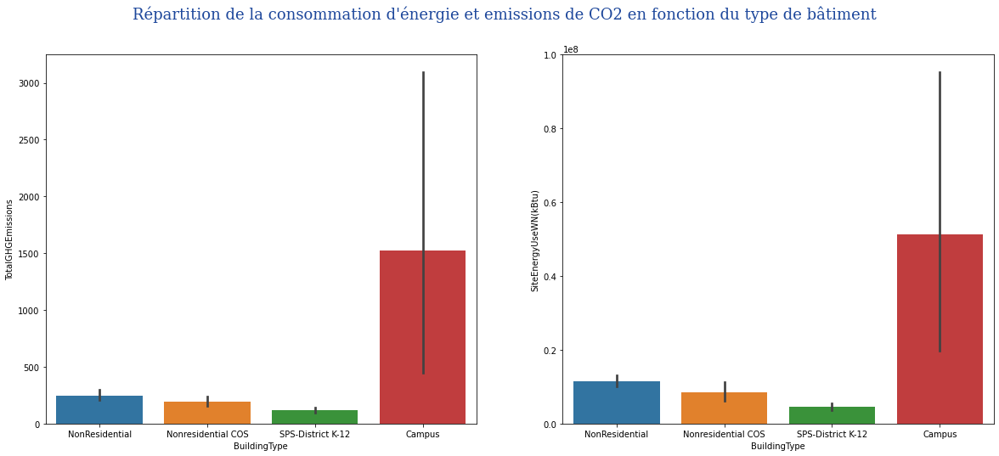

In [111]:
## Répartition des deux variables cibles: 'TotalGHGEmissions' et 'SiteEnergyUseWN(kBtu)' en fonction du type de bâtiment.
fig, axes = plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20,8))
sns.barplot(x='BuildingType',y='TotalGHGEmissions',data=data, ax=axes[0])
sns.barplot(x='BuildingType',y='SiteEnergyUseWN(kBtu)',data=data, ax=axes[1])
plt.suptitle("Répartition de la consommation d'énergie et emissions de CO2 en fonction du type de bâtiment", 
             fontdict=font_title, fontsize=18)
plt.savefig('GRAPHS/10- Energy_CO2_typeBât')
plt.show()

In [112]:
# Sur ces diagrammes en barre, nous observons que les batiments de type campus se démarquent largement en terme de consommation de l'énergie et des émissions de CO2.

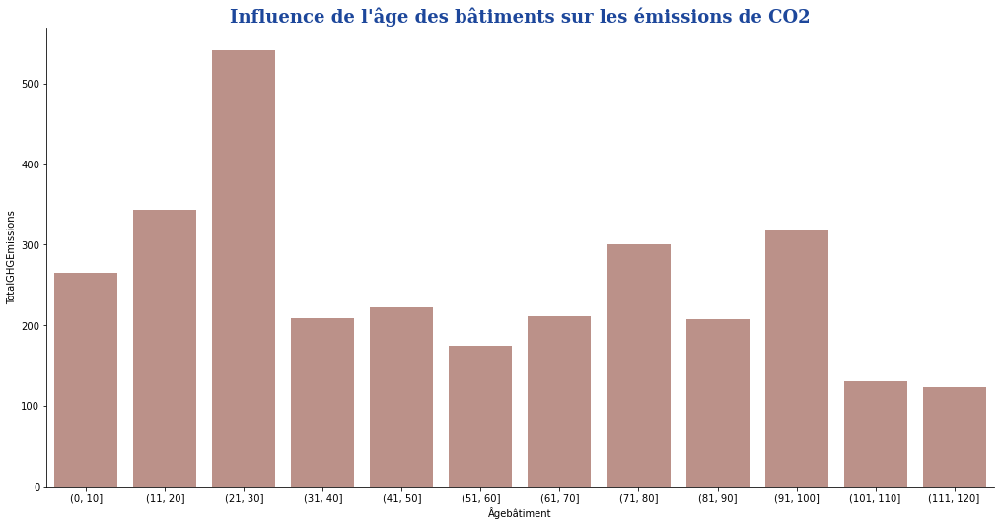

In [113]:
# Impact de l'âge des bâtiments sur les émissions de CO2.
bins = pd.IntervalIndex.from_tuples([(0, 10), (11, 20), (21, 30), (31, 40), (41, 50), 
                                     (51, 60), (61, 70), (71,80), (81,90), (91,100), 
                                     (101, 110), (111, 120)])

sns.catplot(
    data=data, kind="bar",
    x=pd.cut(data['Âgebâtiment'], bins=bins), y="TotalGHGEmissions",
    ci=None, color="#9C3E2D", alpha=.6,
    height=7, aspect=2
)
plt.title("Influence de l'âge des bâtiments sur les émissions de CO2", fontdict=font_title)
plt.savefig('GRAPHS/11- ÂgeBât_CO2')
plt.show()

In [114]:
# Certains âges de bâtiments ont de plus fortes émissions de Co2. Notemment les tranches [21-30].

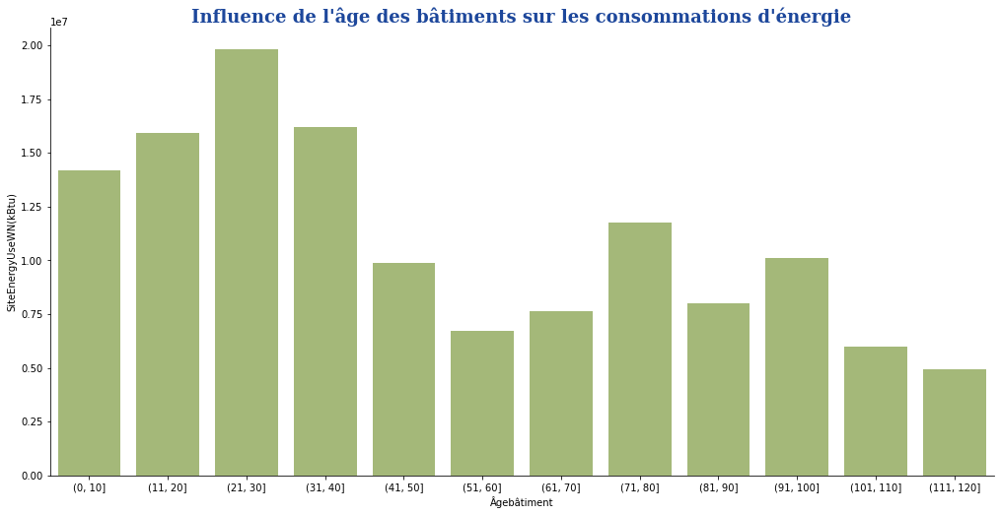

In [115]:
# Influence de l'âge des bâtiments sur les les consommations d'énergie.
sns.catplot(
    data=data, kind="bar",
    x=pd.cut(data['Âgebâtiment'], bins=bins), y="SiteEnergyUseWN(kBtu)",
    ci=None, color="#6D9C0E", alpha=.6,
    height=7, aspect=2
)
plt.title("Influence de l'âge des bâtiments sur les consommations d'énergie", fontdict=font_title)
plt.savefig('GRAPHS/12- ÂgeBât_Energy')
plt.show()

In [116]:
# De façon générale, Les bâtiments de moins de 30 ans semblent avoir des consommations d'énergie et de émissions de CO2 plus important que les bâtiments anciens, alors même que la variable 'Âgebâtiment' n'est pas fortement corrélée à d'autres variables, comme la taille des bâtiments par exemple.

In [117]:
#
map_osm = folium.Map()
map_osm = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()],zoom_start=11)
for i in range(0,len(data)):
    folium.Circle([data.iloc[i]['Latitude'],data.iloc[i]['Longitude']], 
                      popup=data.iloc[i]['Address'], radius =100).add_to(map_osm)
map_osm

In [118]:
# VII-NETTOYAGE FINAL.
# On supprime les colonnes non pertinente pour notre analyse.
data = data.drop(['Latitude','Longitude','Address'] ,axis=1 )

In [119]:
# Suppression des valeurs manquantes des variables ci-dessous.
cols = ['TotalGHGEmissions','SiteEnergyUseWN(kBtu)','BuildingType','PrimaryPropertyType','Neighborhood','LargestPropertyUseType',
                   'consumption_rate_Electricity','consumption_rate_Gas','consumption_rate_Steam', 'NumberofBuildings','NumberofFloors',
                    'PropertyGFATotal','Âgebâtiment','GFABuildingRate','GFAParkingRate',
                    'GFAPerBuilding','GFAPerFloor']
for col in cols:
    data=data.drop(data[data[col].isnull()].index)
data.reset_index(drop=True,inplace=True)

In [120]:
# Définition des valeurs inf pour les variables 'GFAPerBuilding' et 'GFAPerFloor'.
data[(data.GFAPerBuilding == np.inf) | (data.GFAPerFloor == np.inf)].head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,NumberofBuildings,NumberofFloors,PropertyGFATotal,ListOfAllPropertyUseTypes,LargestPropertyUseType,ENERGYSTARScore,SiteEUIWN(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUseWN(kBtu),Electricity(kWh),ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity,Âgebâtiment,out_clas,consumption_rate_Electricity,consumption_rate_Gas,consumption_rate_Steam,GFABuildingRate,GFAParkingRate,GFAPerBuilding,GFAPerFloor,Harvesine_distance
57,89,2016,NonResidential,Healthcare,98122.0,1978201270,3,EAST,0.0,3,179014,Medical Office,Healthcare,48.0,92.300003,210.300003,16527711.0,2.897563e+06,Compliant,430.84,2.41,51,Low,High Usage,High Usage,Low Usage,1.00000,0.00000,inf,59671.333,0.658562
144,267,2016,NonResidential,Lodging/Residential,98101.0,6792120000,7,DOWNTOWN,1.0,0,934292,"Hotel, Other, Parking, Restaurant, Retail Store",Lodging/Residential,75.9,120.500000,278.200012,66502836.0,1.153696e+07,Compliant,1638.46,1.75,17,Low,High Usage,High Usage,Low Usage,1.00000,0.00000,934292.0,inf,0.455683
172,322,2016,NonResidential,Office,98121.0,0656000005,7,DOWNTOWN,0.0,3,100734,Office,Office,20.0,98.199997,308.399994,9892566.0,2.868908e+06,Compliant,68.24,0.68,48,Low,High Usage,Low Usage,Low Usage,0.73464,0.26536,inf,33578.000,1.186739
208,366,2016,NonResidential,Office,98105.0,1142000500,4,NORTHEAST,0.0,5,99005,Office,Office,70.0,63.000000,140.699997,5008123.5,8.391593e+05,Compliant,119.03,1.20,55,Low,High Usage,High Usage,Low Usage,1.00000,0.00000,inf,19801.000,3.854787
228,391,2016,NonResidential,Mixed Use,98108.0,0007400015,2,GREATER DUWAMISH,0.0,1,88400,"Distribution Center, Non-Refrigerated Warehous...",Warehouse/Storage,42.0,53.000000,113.900002,4811200.0,7.416934e+05,Compliant,116.03,1.31,46,Low,High Usage,High Usage,Low Usage,1.00000,0.00000,inf,88400.000,5.630769


In [121]:
# Traitement des valeurs inf des variables 'GFAPerBuilding' et 'GFAPerFloor', et des valeurs nulles de la variable 'NumberofBuildings'.
data['GFAPerBuilding'] = np.where(((data.GFAPerBuilding == np.inf) & (data.NumberofBuildings == 0)),0, data.GFAPerBuilding)
data['GFAPerFloor'] = np.where(((data.GFAPerFloor == np.inf) & (data.NumberofFloors == 0)),0, data.GFAPerFloor)

In [122]:
# Supprimons les variables non pertinentes du dataset pour notre étude.
data  = data.drop(['OSEBuildingID','ComplianceStatus','out_clas','CouncilDistrictCode','ZipCode','Electricity(kWh)','GHGEmissionsIntensity'], axis=1)

In [123]:
# Dimension du dataset.
data.shape

(1085, 24)

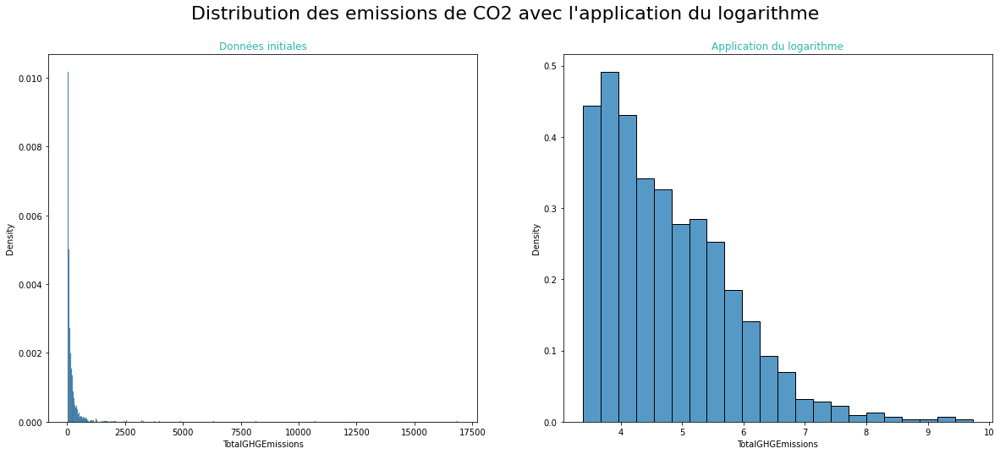

In [124]:
# Transformation logarithmique de la variable cible 'TotalGHGEmissions' et 'SiteEnergyUseWN(kBtu)'.
Y = data[["TotalGHGEmissions","SiteEnergyUseWN(kBtu)"]]
logtransformer = FunctionTransformer(np.log, inverse_func = np.exp, check_inverse = True)
Y_log = logtransformer.transform(Y)

fig, axes = plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20,8))
sns.histplot(data=Y, x='TotalGHGEmissions', stat="density", ax=axes[0])
axes[0].set_title("Données initiales", color='#2cb7b0')
sns.histplot(data=Y_log, x='TotalGHGEmissions', stat="density", ax=axes[1])
axes[1].set_title("Application du logarithme", color='#2cb7b0')
plt.suptitle("Distribution des emissions de CO2 avec l'application du logarithme",fontsize=22)
plt.savefig('GRAPHS/13- Distrib_CO2')
plt.show()

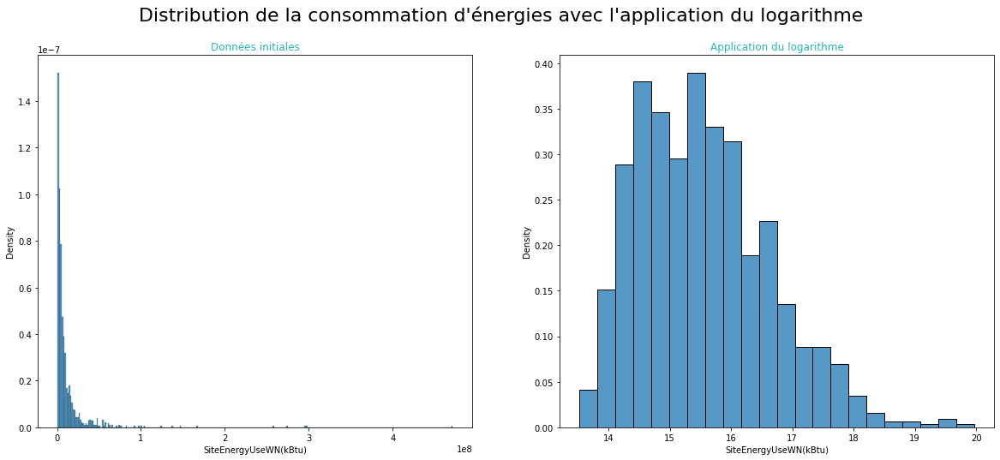

In [125]:
fig, axes = plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20,8))
sns.histplot(data=Y, x='SiteEnergyUseWN(kBtu)', stat="density", ax=axes[0])
axes[0].set_title("Données initiales", color='#2cb7b0')
sns.histplot(data=Y_log, x='SiteEnergyUseWN(kBtu)', stat="density", ax=axes[1])
axes[1].set_title("Application du logarithme", color='#2cb7b0')
plt.suptitle("Distribution de la consommation d'énergies avec l'application du logarithme",fontsize=22)
plt.savefig('GRAPHS/14- Distrib_Energy')
plt.show()

In [126]:
# Définition des variables logarithmiques des targets.
data["SiteEnergyUseWN(kBtu)_log"] = np.log(data["SiteEnergyUseWN(kBtu)"])
data["TotalGHGEmissions_log"] = np.log(data["TotalGHGEmissions"])

In [127]:
# Suppression des variables non pertitentes dans cette étude.
data = data.drop(['TaxParcelIdentificationNumber','ListOfAllPropertyUseTypes', 'DataYear','SourceEUIWN(kBtu/sf)','SiteEUIWN(kBtu/sf)'], axis=1)

In [128]:
# Edition de la dimension du dataset final.
print(data.shape)

(1085, 21)


In [129]:
# Exportation du dataset pour la modélisation.
data.to_csv('clean_data_final.csv', sep= ',', index=False)